# Simulation study

This notebook illustrates the application of the approach on the on a simulated dataset that mimicks the structure of the SMArtCARE data. It reproduces Figure 2 in the main part of the manuscript and Figures 4, 5 and 6 and Table 1 in the supplementary material, Section 6.3.

## Setup

First, we install and load the `LatentDynamics` package, which bundles all functions needed for our proposed approach. We also load the environment specified in the `.toml` files in the `notebooks` subfolder, which specify some packages required additionally, e.g., for plotting. 


In [1]:
cd(@__DIR__)
using Pkg;
Pkg.activate(".")
Pkg.instantiate()

Pkg.add(url="https://github.com/maren-ha/LatentDynamics.jl")

Pkg.status()

  Activating project at `~/Desktop/smartcare/ODE-VAE/LatentDynamics/notebooks`


We load the `LatentDynamics` package, the `DataFrames` and `CSV` packages for saving data, the `Plots` package for visualization, the `Random` package for setting seeds for reproducibility and the `StatsBase` package for calculating some summary statistics of model predictions. 

In [2]:
using LatentDynamics

using CSV 
using DataFrames
using Plots
using Random
using StatsBase

We save the figures and a table with prediction errors in a `results` directory that we set up below. 

In [3]:
save_dir = "results"
!isdir(save_dir) && mkdir(save_dir)

false

## Specifying the dynamic model

First, we select the dynamic system for the ODE. The available choices include the following functions: 

- `params_fullhomogeneous`: 2-dimensional homogeneous ODE system with full system matrix: 4 parameters 
- `params_driftonly`: 2-dimensional constant ODE system: 2 parameters
- `params_diagonalhomogeneous`: 2-dimensional homogeneous ODE system with diagonal system matrix: 2 parameters
- `params_offdiagonalinhomogeneous`: 2-dimensional inhomogeneous ODE system with system matrix with nonzero off-diagonal elements and zero diagonal: 4 parameters
- `params_diagonalinhomogeneous`: 2-dimensional inhomogeneous ODE system with diagonal system matrix: 4 parameters
- `params_fullinhomogeneous`: 2-dimensional inhomogeneous ODE system with full system matrix: 6 parameters

We choose a homogeneous system with a full system matrix, i.e., with four unknown parameters. The ODE system defined in latent space is thus 

$$ 
\begin{aligned} 
    \frac{\mathrm{d}}{\mathrm{d}t} \begin{pmatrix} \mu_1 \\ \mu_2 \end{pmatrix} (t) 
        &= \begin{pmatrix} \eta_1 & \eta_2 \\ \eta_3 & \eta_4 \end{pmatrix} \begin{pmatrix} \mu_1 \\ \mu_2 \end{pmatrix}(t) 
\end{aligned} 
$$

where $\eta_1, \eta_2, \eta_3, \eta_4$ are the unknown ODE parameters that we infer with an additional neural network from patients' baseline characteristics, to allow for individual-specific trajectories. 

In [4]:
dynamics = params_fullhomogeneous 


params_fullhomogeneous (generic function with 1 method)

## Simulating data 

We simulate data from a simple two-dimensional linear homogeneous ODE system with four parameters. We define two distinct sets of parameters, corresponding to groups of indiduals with distinct underlying trajectories, and simulate individuals from each of the two groups by adding noise to the true trajectories. 

The ODE systems are given by: 
$$
\begin{aligned}
		\frac{d}{dt}\begin{pmatrix} u_1 \\ u_2 \end{pmatrix}(t) &= \begin{pmatrix} -0.2 & 0.1 \\ -0.1 & 0.1 \end{pmatrix} \begin{pmatrix} u_1 \\ u_2 \end{pmatrix}(t); \\
		\begin{pmatrix} u_1 \\ u_2 \end{pmatrix}(0) &= \begin{pmatrix} 3 \\ 1 \end{pmatrix}
	\end{aligned} \quad \quad \quad
	\begin{aligned}
		\frac{d}{dt}\begin{pmatrix} u_1 \\ u_2 \end{pmatrix}(t) &= \begin{pmatrix} -0.2 & -0.1 \\ 0.1 & -0.2 \end{pmatrix} \begin{pmatrix} u_1 \\ u_2 \end{pmatrix}(t); \\
		\begin{pmatrix} u_1 \\ u_2 \end{pmatrix}(0) &= \begin{pmatrix} 3 \\ 1 \end{pmatrix}.
\end{aligned}$$

First, we define the system and the solutions for each of the two groups in Julia. 

In [5]:
trueparams_group1 = [-0.2f0, 0.1f0, -0.1f0, 0.1f0]
trueparams_group2 = [-0.2f0, -0.1f0, 0.1f0, -0.2f0]
true_x0 = Float32[3, 1]

ODEparams1 = dynamics(trueparams_group1)
ODEparams2 = dynamics(trueparams_group2)

tspan = (0.0f0, 10.0f0)
t_range = collect(range(tspan..., step=0.1f0))

sol_group1 = hcat(map(t -> LatentDynamics.generalsolution(t, true_x0, ODEparams1...)[1], t_range)...)
sol_group2 = hcat(map(t -> LatentDynamics.generalsolution(t, true_x0, ODEparams2...)[1], t_range)...)

2×101 Matrix{Float32}:
 3.0  2.95025   2.90101   2.85227   …   0.352367   0.342701   0.333247
 1.0  0.950744  0.902954  0.856595     -0.272486  -0.270531  -0.26852

We can also plot the two solutions: 

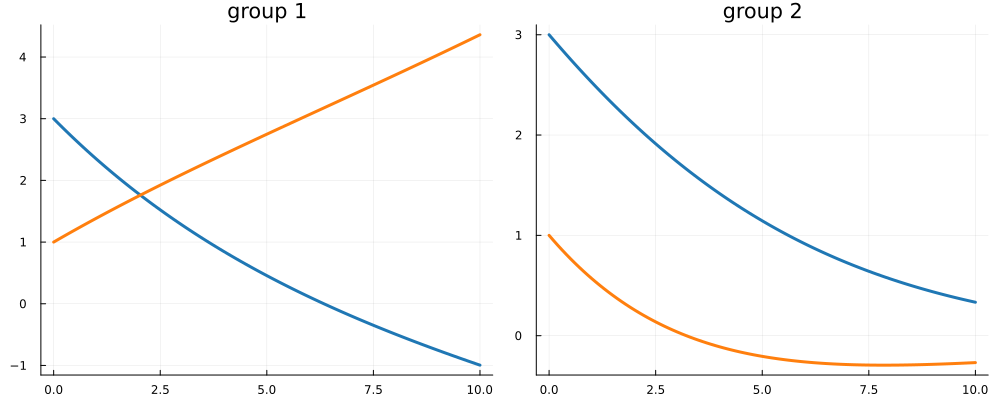

In [6]:
sol1_simple = plot(t_range, sol_group1', legend = false, line=(3, ["#1f77b4" "#ff7f0e"]))
sol2_simple = plot(t_range, sol_group2', legend = false, line=(3, ["#1f77b4" "#ff7f0e"]))

plot(sol1_simple, sol2_simple, 
    layout=(1,2), 
    size=(1000, 400), 
    legend=false, 
    xlabel="", ylabel="", 
    title=["group 1" "group 2"]
)

Next, we simulate data and visualize it together with the ground-truth solutions. The details of the simulation are described in the manuscript in Section 4.1: 

> We simulated $n=100$ individuals split equally into the two groups. For each individual $i=1, \dots, n$, we sampled a random number $T_i$ of between $1$ and $8$ follow-up observations after the common baseline time point $t_0$ at random time points $t_1^i, \dots, t_{T_i}^i$ sampled uniformly from $[1.5,10]$. At each time point $t_k^i$, we simulated measurements of $p=10$ variables by adding a variable-specific measurement error $\delta_{j}^{t_k^i} \sim \mathcal{N}(0,\sigma_{\mathrm{var}}^2)$ for $j=1,\dots, p$ and an individual-specific measurement error $\varepsilon_{i,j}^{t_k^i} \sim \mathcal{N}(0,\sigma_{\mathrm{ind}}^2)$ for $i=1,\dots, n$, $j=1,\dots, p$ to the true value of the ODE solution. 
>For an individual $i$, we then obtained simulated observations $x_i \in \mathbb{R}^{p \times T_i + 1}$ by defining $$ \begin{equation*}    x_{i,j}^{t_k} := u_1(t_k) + \delta_{j}^{t_k} + \varepsilon_{i,j}^{t_k} \quad \text{for } k=0, \dots, T_i+1 \text{ and } j = 1, \dots, 5,  \end{equation*} $$
> and $$ \begin{equation*} x_{i,j}^{t_k} := u_2(t_k) + \delta_{j}^{t_k} + \varepsilon_{i,j}^{t_k} \quad \text{for } k=0, \dots, T_i+1 \text{ and } j = 6, \dots, 10. \end{equation*} $$
>
> We additionally simulated baseline variables by sampling with variance $\sigma_{\mathrm{info}}^2$ from the simulated individual's true ODE parameters to obtain $10$ informative baseline variables and add $40$ noise variables sampled from a centered Gaussian distribution with variance $\sigma_{\mathrm{noise}}^2$, such that we ended up with a total of $q = 50$ baseline variables.
> We set $\sigma_{\mathrm{ind}}^2 = 0.5$ and $\sigma_{\mathrm{var}}^2 = \sigma_{\mathrm{info}}^2 = \sigma_{\mathrm{noise}}^2 = 0.1$. 

In Julia code, we get the following: 

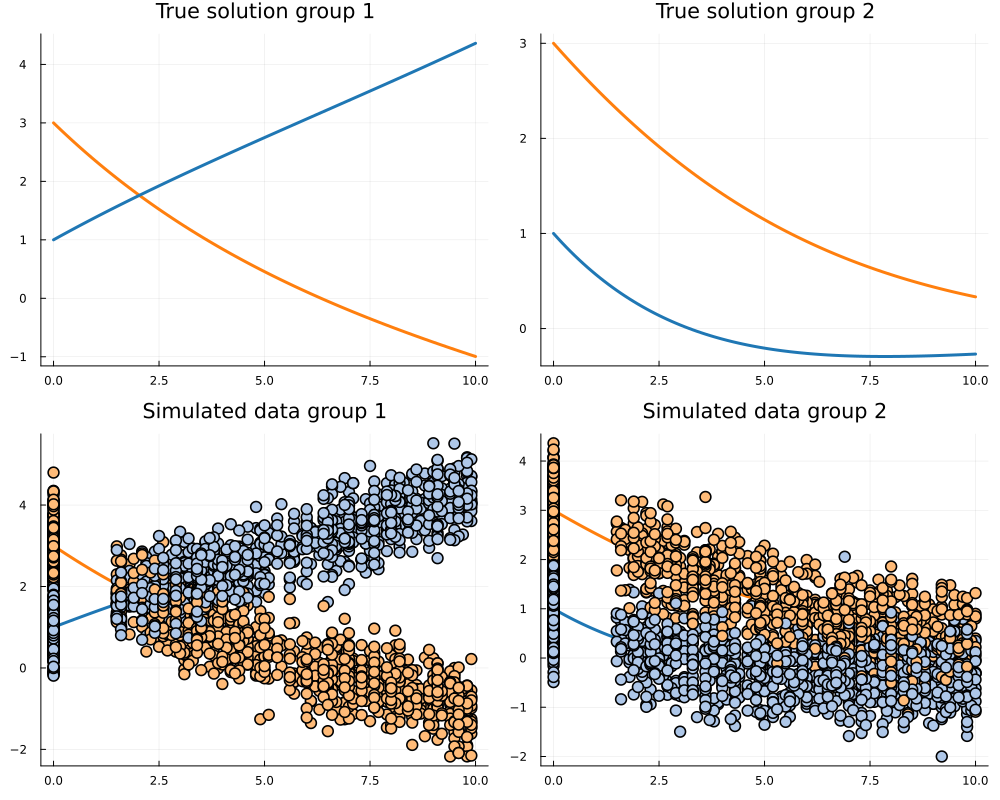

In [7]:
n = 100 
p = 10
q, q_info = 50, 10
dt=0.1f0

# set seed for reproducibility
Random.seed!(12);

# generate time dependent variables
xs, tvals, group1, group2 = generate_xs(n, p, true_x0, sol_group1, sol_group2, maxntps=8); 
# generate baseline variables
xs_baseline = generate_baseline(n, q, q_info, group1, trueparams_group1, trueparams_group2); 

data = simdata(xs, xs_baseline, tvals, group1, group2);

# plot true solutions and simulated data
plot(
    plot_truesolution(1,  data, t_range, sol_group1, sol_group2, showdata=false), 
    plot_truesolution(2, data, t_range, sol_group1, sol_group2, showdata=false), 
    plot_truesolution(1,  data, t_range, sol_group1, sol_group2, showdata=true),
    plot_truesolution(2, data, t_range, sol_group1, sol_group2, showdata=true), 
    layout = (2,2),
    legend = false, 
    size = (1000, 800), 
    title=["True solution group 1" "True solution group 2" "Simulated data group 1" "Simulated data group 2"]
)

## Defining and training the model 
Next, we specify the ODE-VAE model structure using the `ModelArgs` structure. This includes the number of input dimensions for the encoder neural network and the neural network that maps baseline variables to ODE parameters, the choice of the dynamic system, some some details about the architecture of the baseline variable neural network. The number of latent dimensions is internally fixed to $2$. 

We then initialize a model using the `odevae` constructor method. 

In [8]:
n = length(xs)

# init model 
modelargs = ModelArgs(p=size(xs[1],1), 
                    q=length(xs_baseline[1]),
                    dynamics=dynamics,
                    seed=18,
                    bottleneck=false,
                    scale_sigmoid=1,
                    add_diagonal=true
)
m = odevae(modelargs)

odevae(10, 50, 2, Chain(Dense(50 => 50, tanh), Dense(50 => 4, #51), Scale(4)), Dense(10 => 10, #53), Dense(10 => 2), Chain(Dense(10 => 2, #54), Scale(2)), Dense(2 => 10, tanh), Dense(10 => 10), Dense(10 => 10), LatentDynamics.params_fullhomogeneous)

## Training the model

We define the loss function behavior and the optimization hyperparameters using the `LossArgs` structure. We define additional penalties to regularize the ODE solution estimator appropriately.  

We then train the model for 30 training epochs using a learning rate of 0.0005. The initialized model (`m`), the time-dependent and baseline variables (`xs`, `xs_baseline`), the time points of each patient's follow-up visits, and the training hyperparameters and loss function arguments are all passed to the `train_model!` function.

If desired, the latent trajectories of a selected number of exemplary individuals (`selected_ids`) can be plotted after each epoch to illustrate how training progresses  with `plotting=true`. For this, we need to specify a dedicated wrapper function that will produce the plot as a function of the model `m`, as shown below. 

Additionally, if the `verbose` keyword is set to `true`, loss values are displayed after each training epoch. 

[ Info: 1


mean((loss(data..., m, args = args) for data = trainingdata)) = 26.926668f0


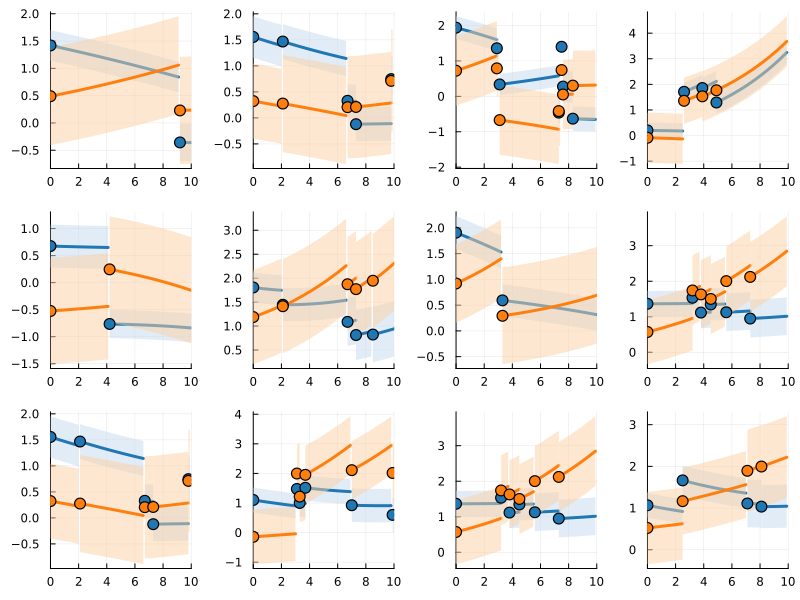

[ Info: 2


mean((loss(data..., m, args = args) for data = trainingdata)) = 24.13229f0


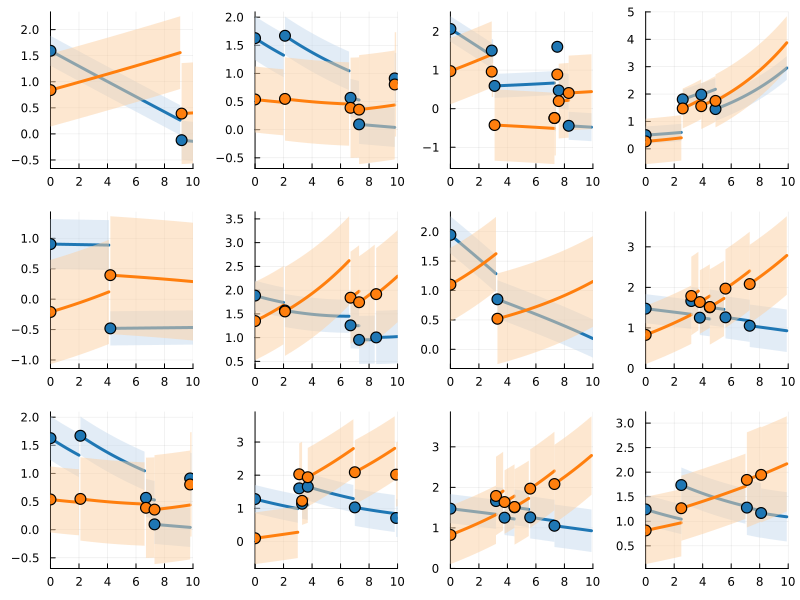

[ Info: 3


mean((loss(data..., m, args = args) for data = trainingdata)) = 22.245842f0


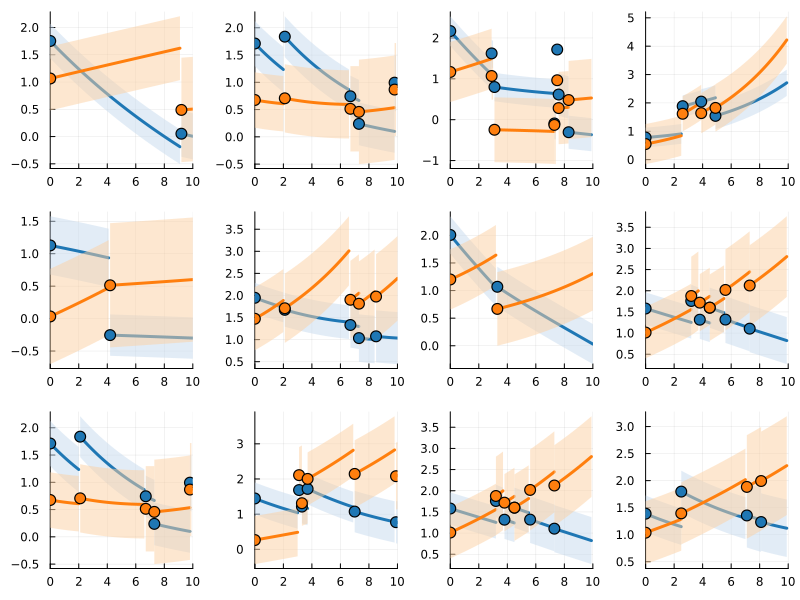

[ Info: 4


mean((loss(data..., m, args = args) for data = trainingdata)) = 21.07051f0


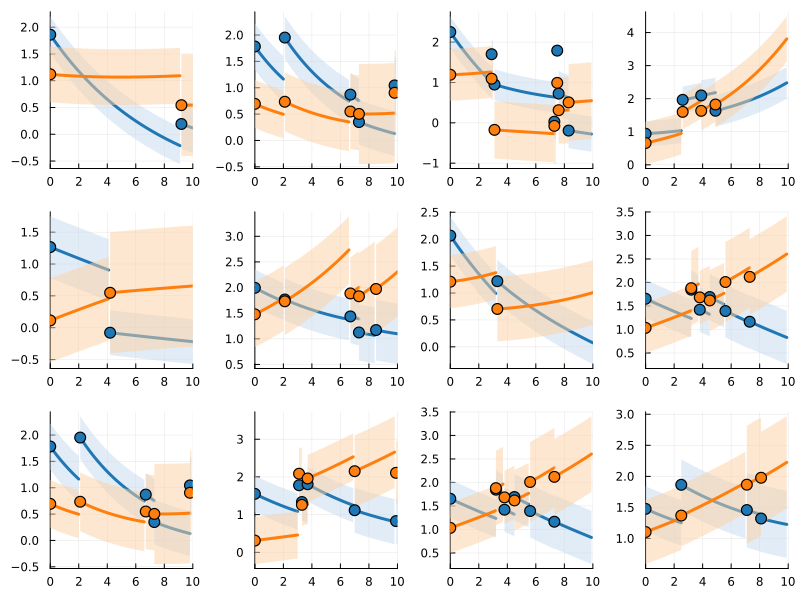

[ Info: 5


mean((loss(data..., m, args = args) for data = trainingdata)) = 20.223555f0


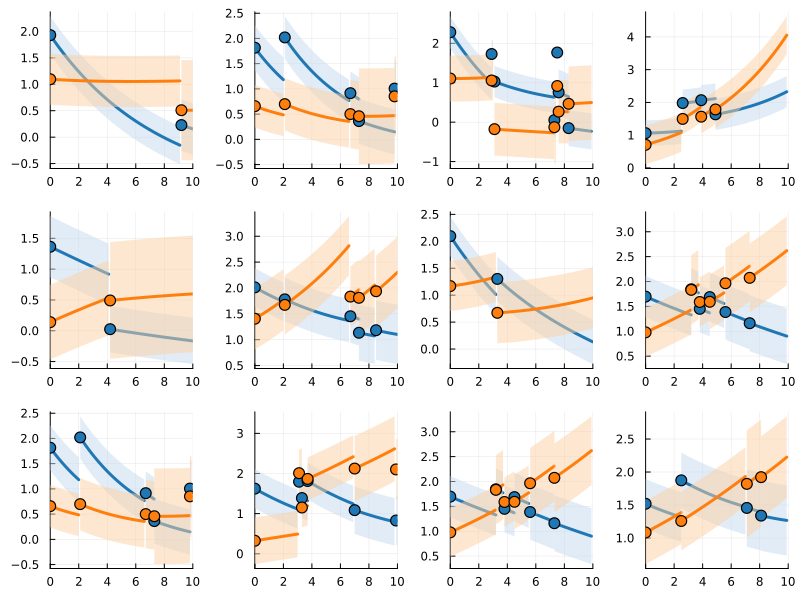

[ Info: 6


mean((loss(data..., m, args = args) for data = trainingdata)) = 19.58954f0


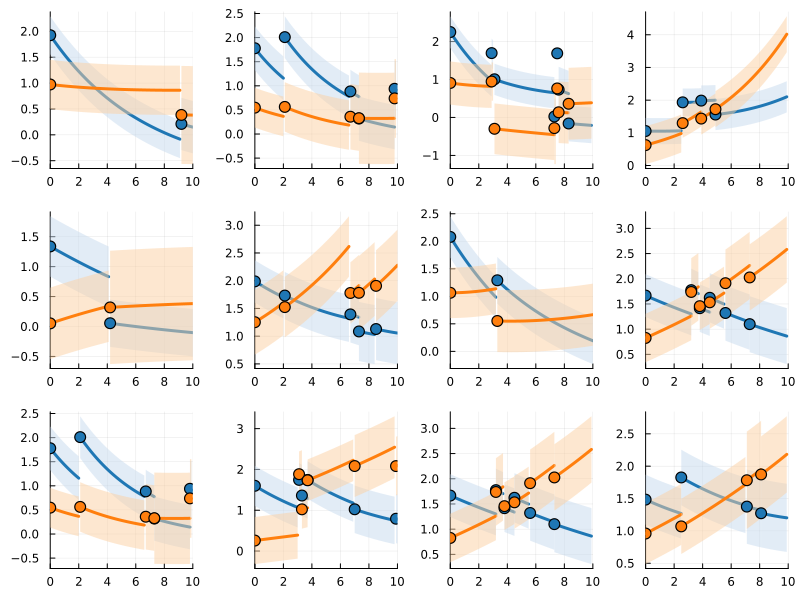

[ Info: 7


mean((loss(data..., m, args = args) for data = trainingdata)) = 19.052221f0


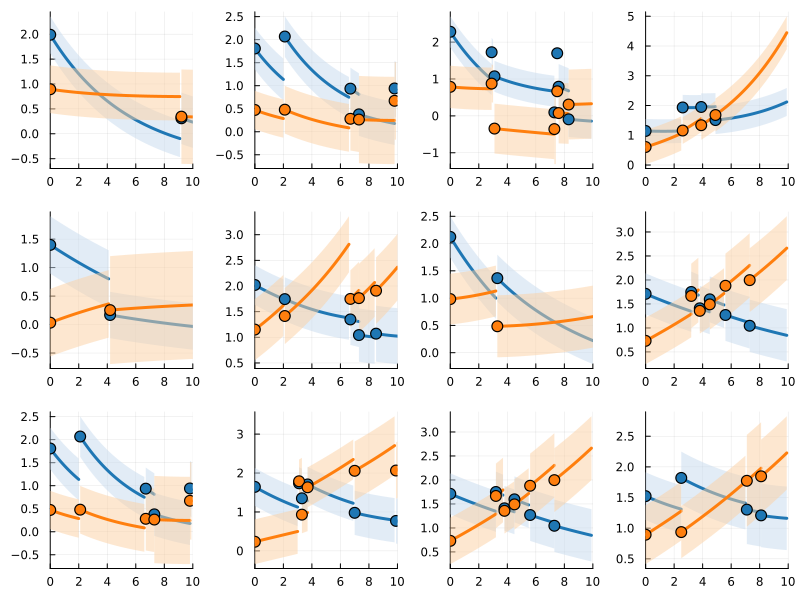

[ Info: 8


mean((loss(data..., m, args = args) for data = trainingdata)) = 18.757635f0


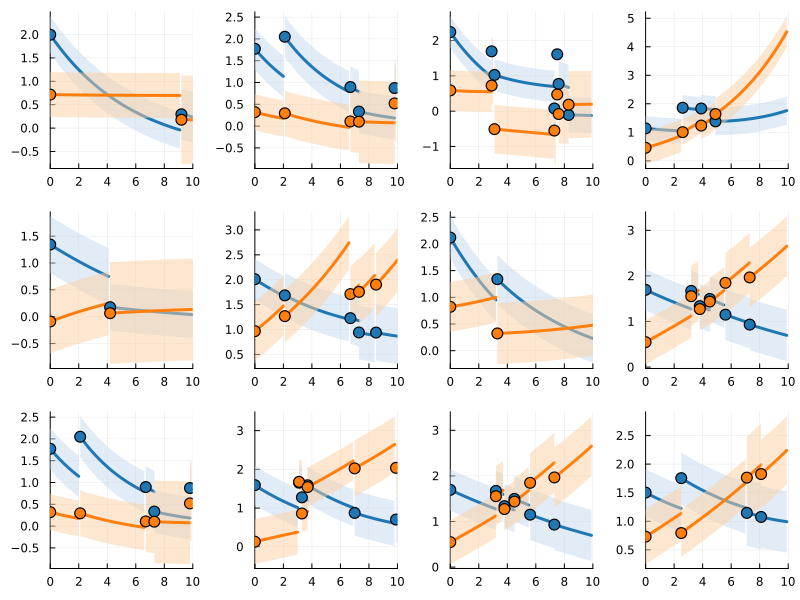

[ Info: 9


mean((loss(data..., m, args = args) for data = trainingdata)) = 18.27014f0


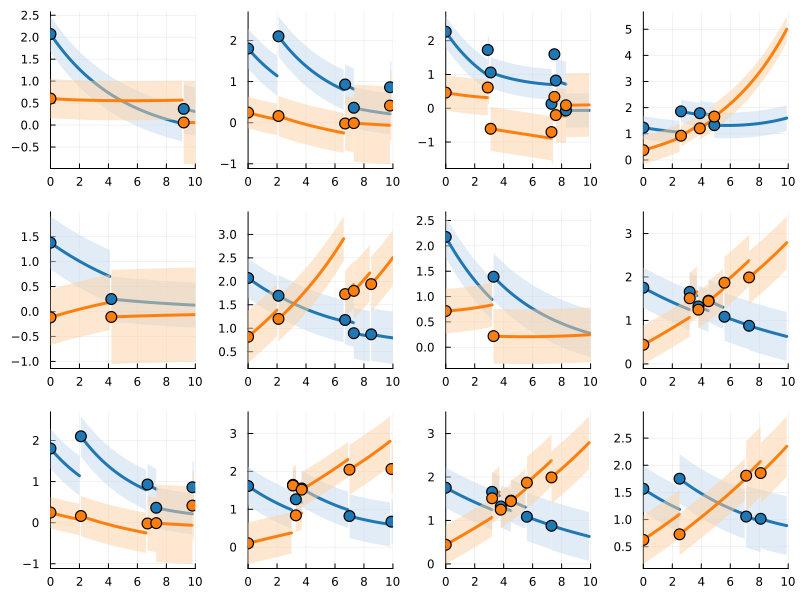

[ Info: 10


mean((loss(data..., m, args = args) for data = trainingdata)) = 17.817572f0


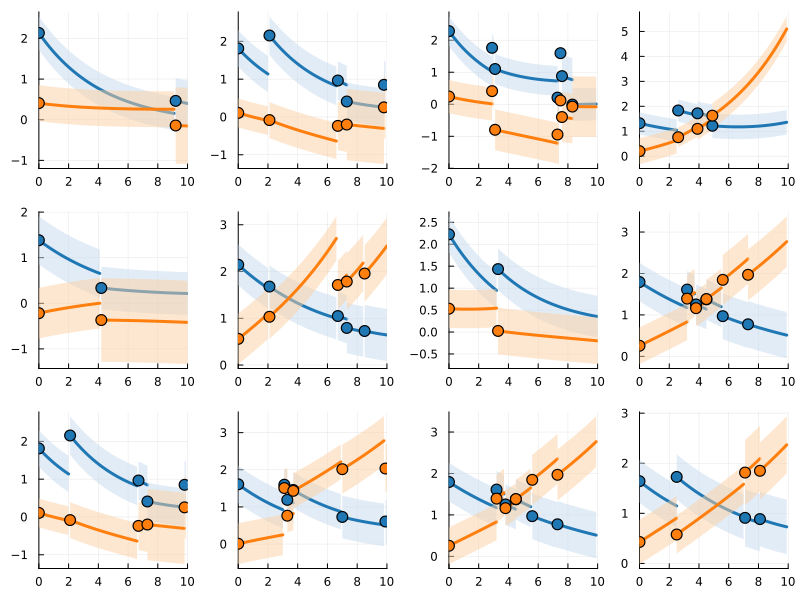

[ Info: 11


mean((loss(data..., m, args = args) for data = trainingdata)) = 17.208166f0


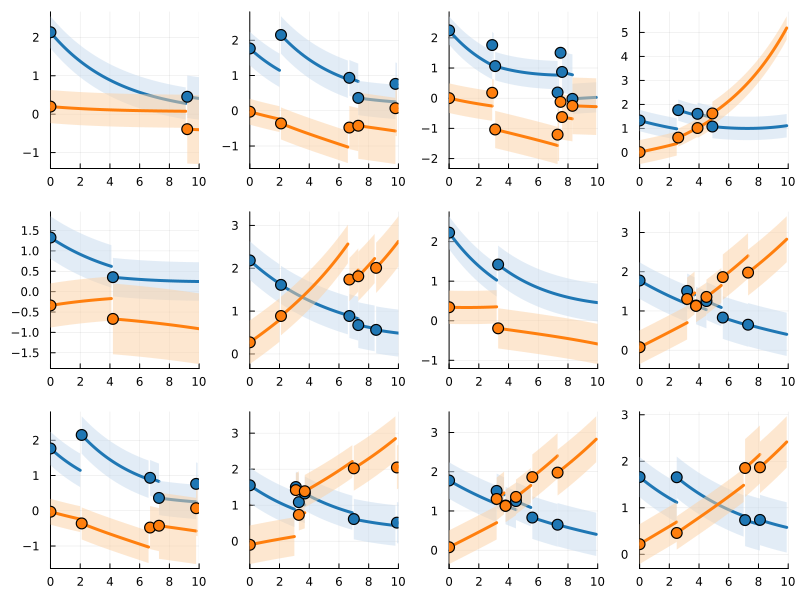

[ Info: 12


mean((loss(data..., m, args = args) for data = trainingdata)) = 16.775711f0


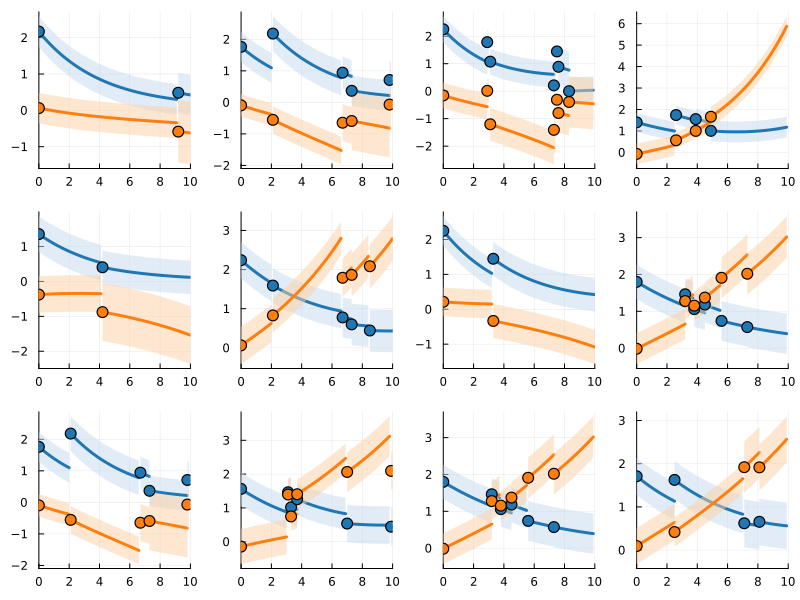

[ Info: 13


mean((loss(data..., m, args = args) for data = trainingdata)) = 16.227076f0


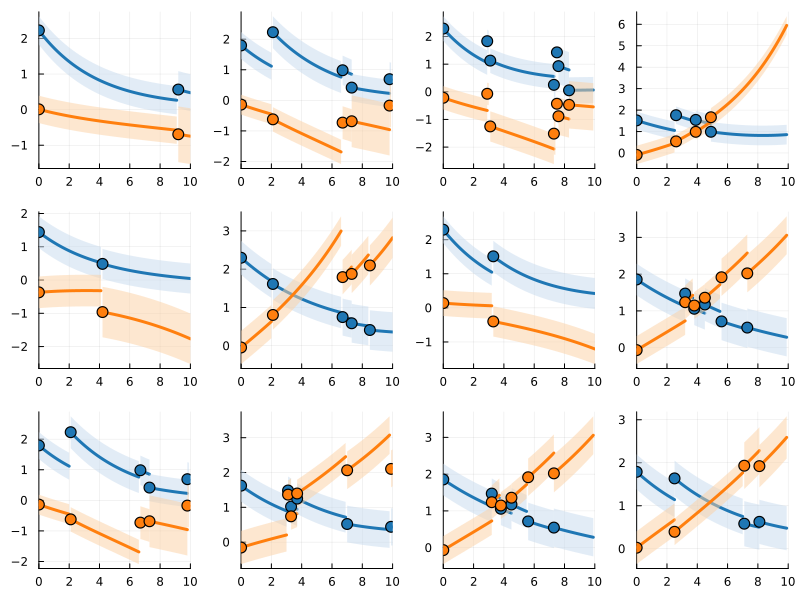

[ Info: 14


mean((loss(data..., m, args = args) for data = trainingdata)) = 15.80794f0


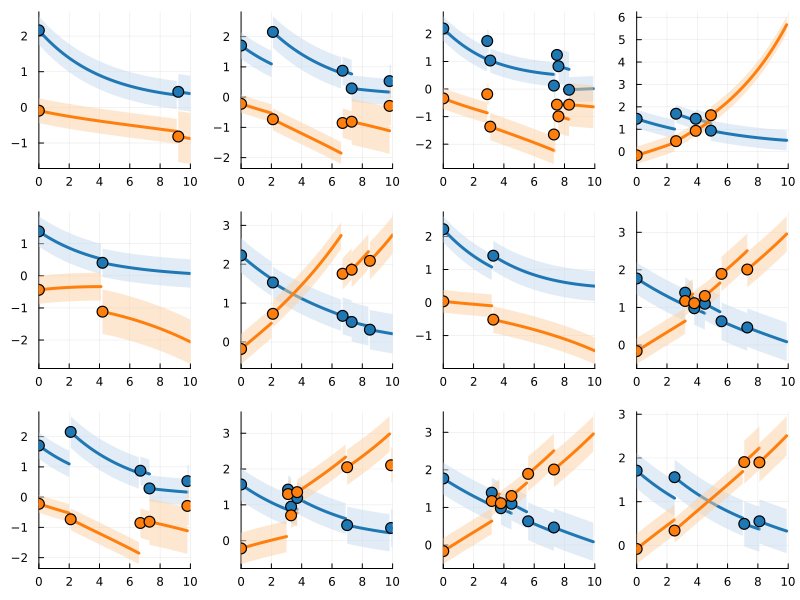

[ Info: 15


mean((loss(data..., m, args = args) for data = trainingdata)) = 15.397452f0


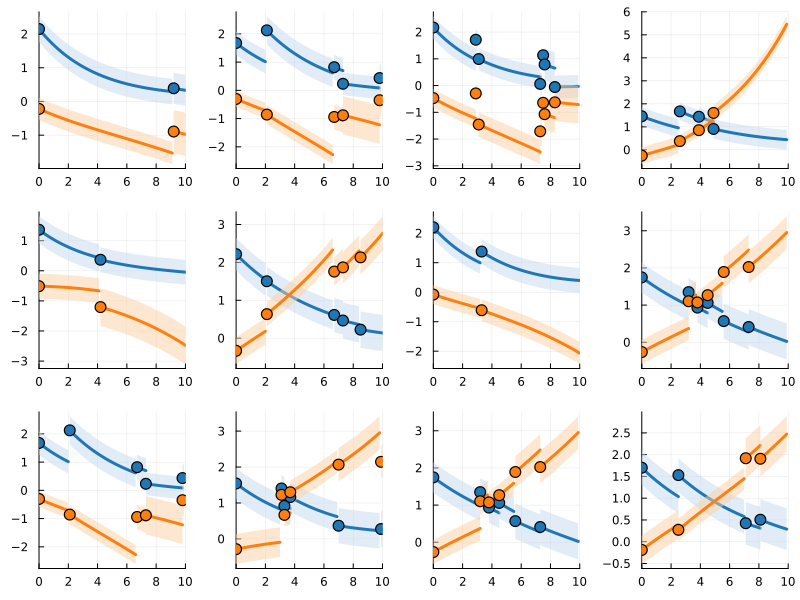

[ Info: 16


mean((loss(data..., m, args = args) for data = trainingdata)) = 15.108258f0


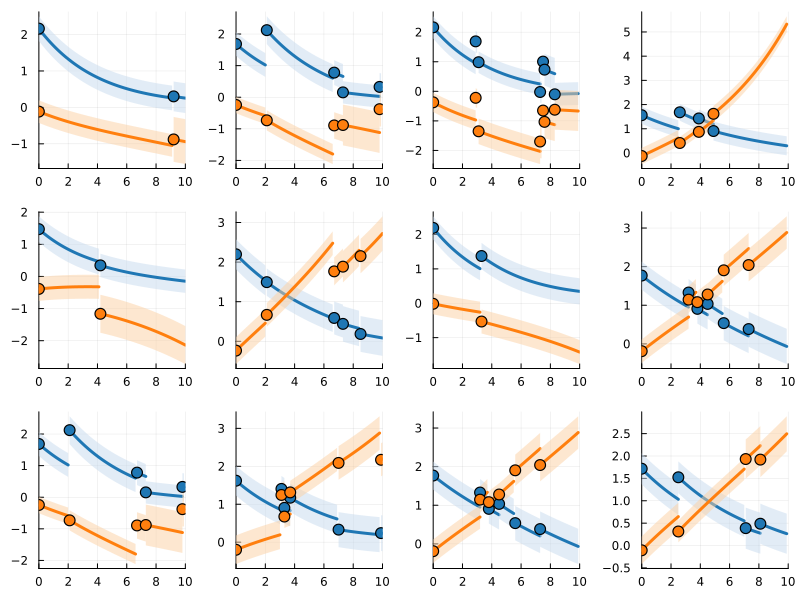

[ Info: 17


mean((loss(data..., m, args = args) for data = trainingdata)) = 14.632029f0


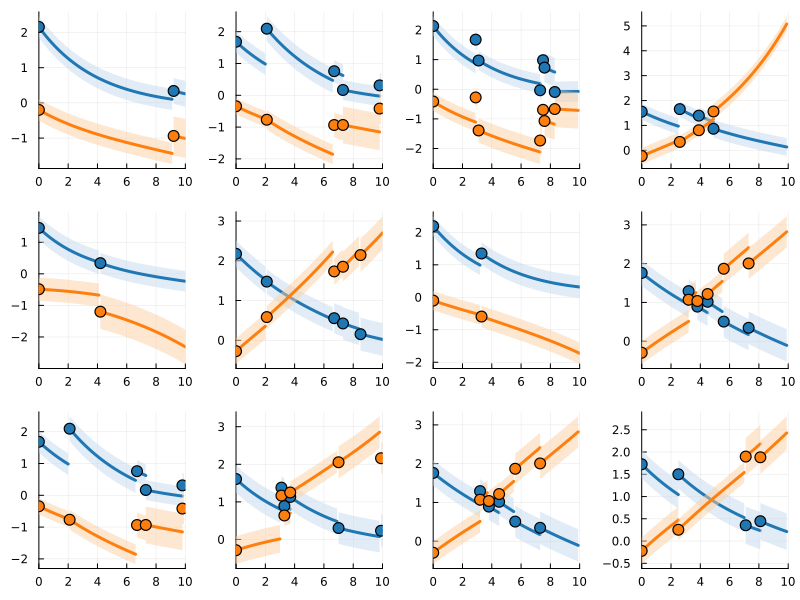

[ Info: 18


mean((loss(data..., m, args = args) for data = trainingdata)) = 14.530067f0


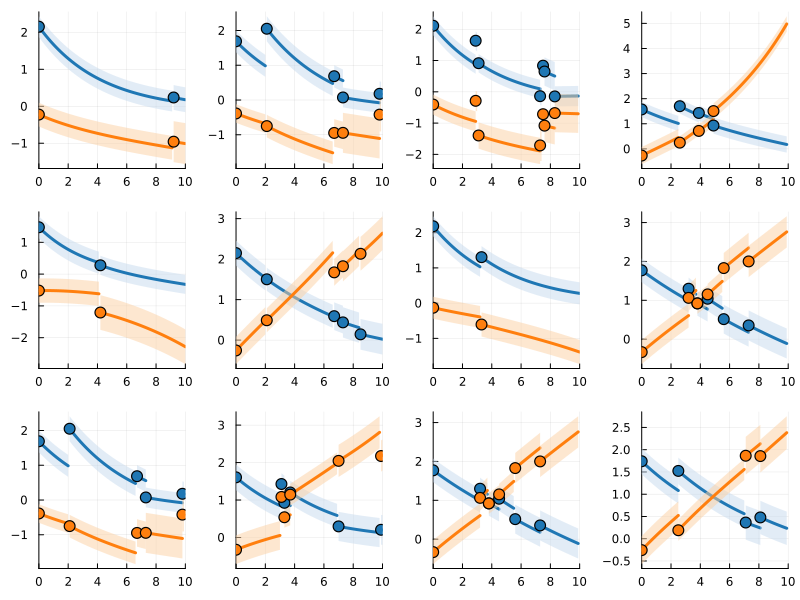

[ Info: 19


mean((loss(data..., m, args = args) for data = trainingdata)) = 14.074577f0


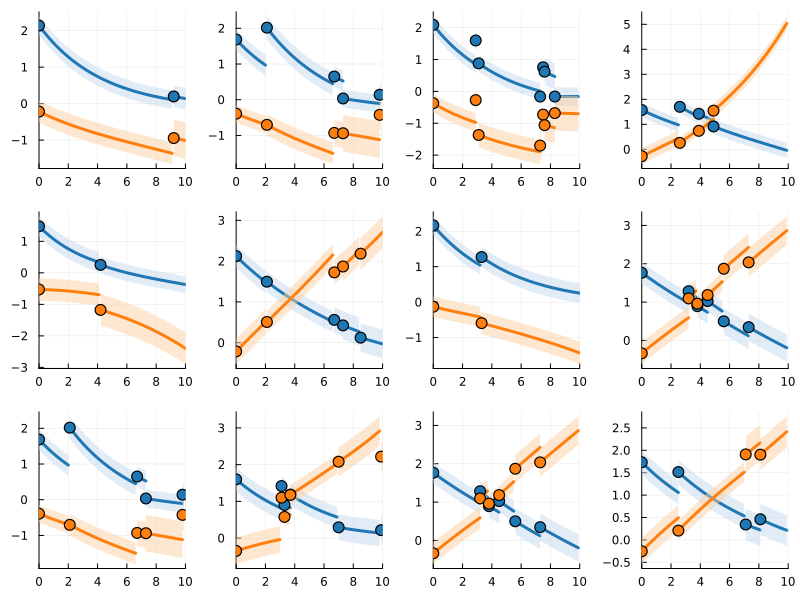

[ Info: 20


mean((loss(data..., m, args = args) for data = trainingdata)) = 13.880654f0


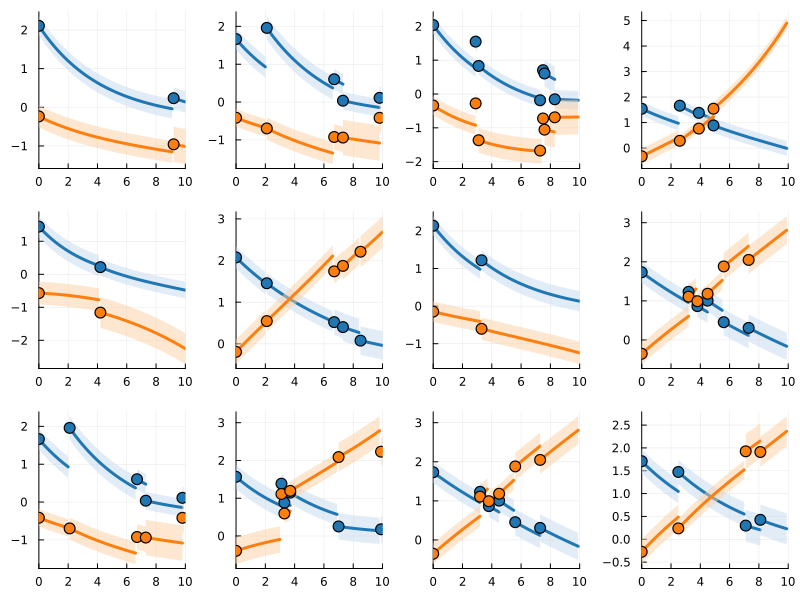

[ Info: 21


mean((loss(data..., m, args = args) for data = trainingdata)) = 13.628031f0


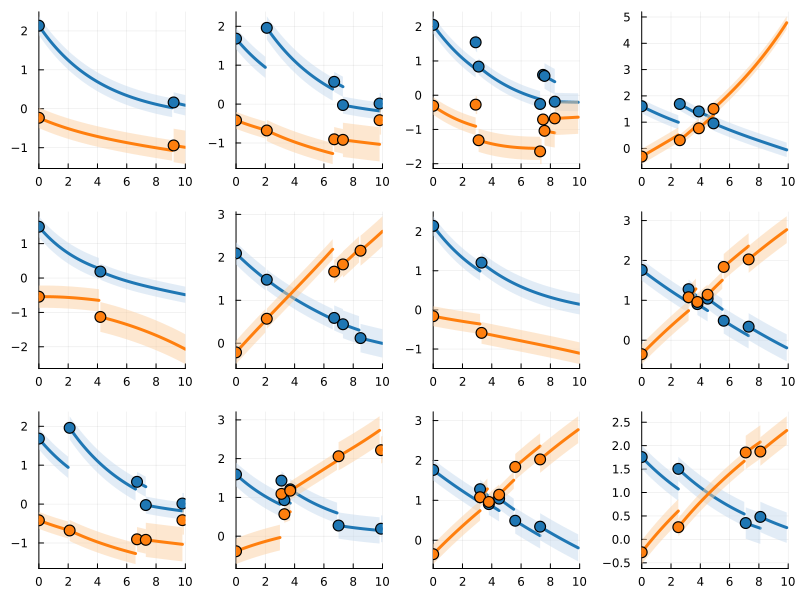

[ Info: 22


mean((loss(data..., m, args = args) for data = trainingdata)) = 13.49766f0


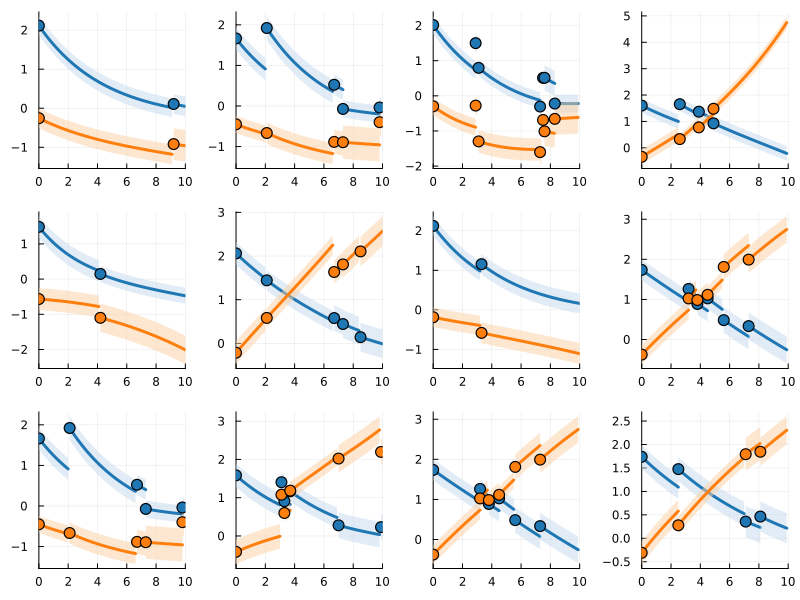

[ Info: 23


mean((loss(data..., m, args = args) for data = trainingdata)) = 13.355797f0


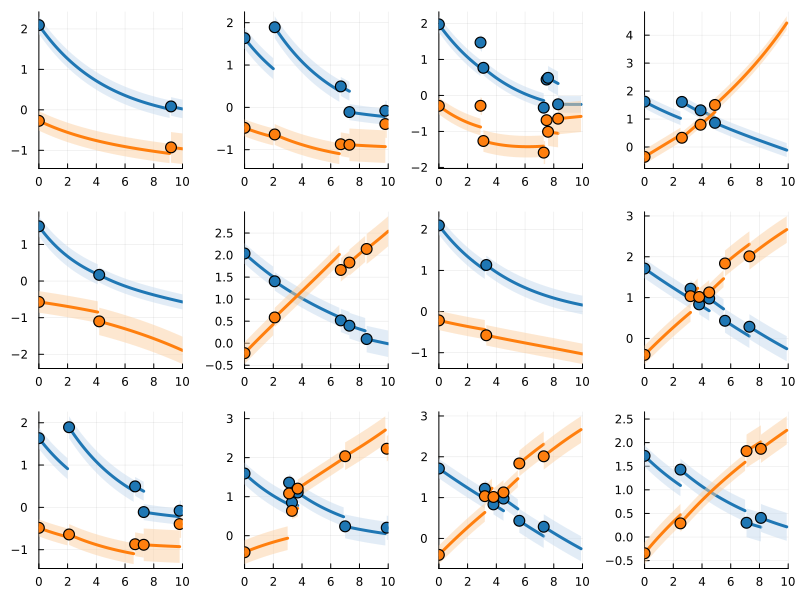

[ Info: 24


mean((loss(data..., m, args = args) for data = trainingdata)) = 13.189131f0


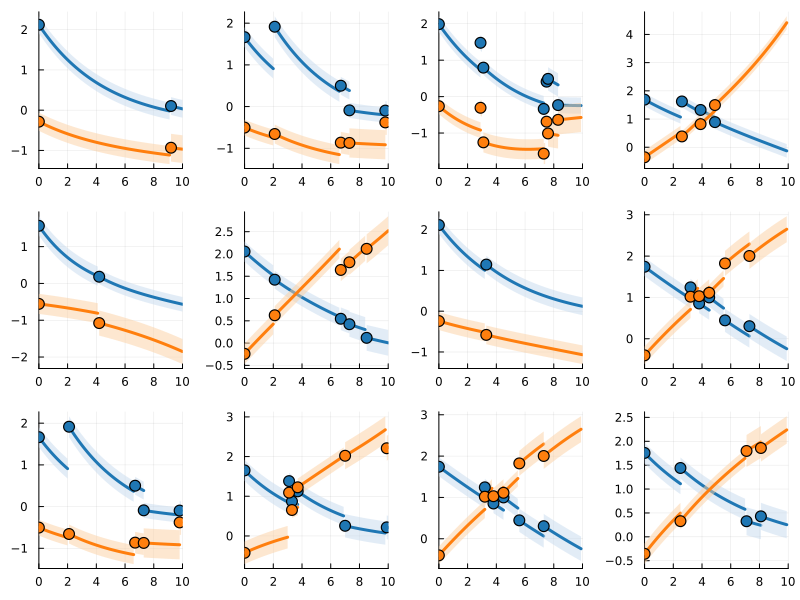

[ Info: 25


mean((loss(data..., m, args = args) for data = trainingdata)) = 13.0245495f0


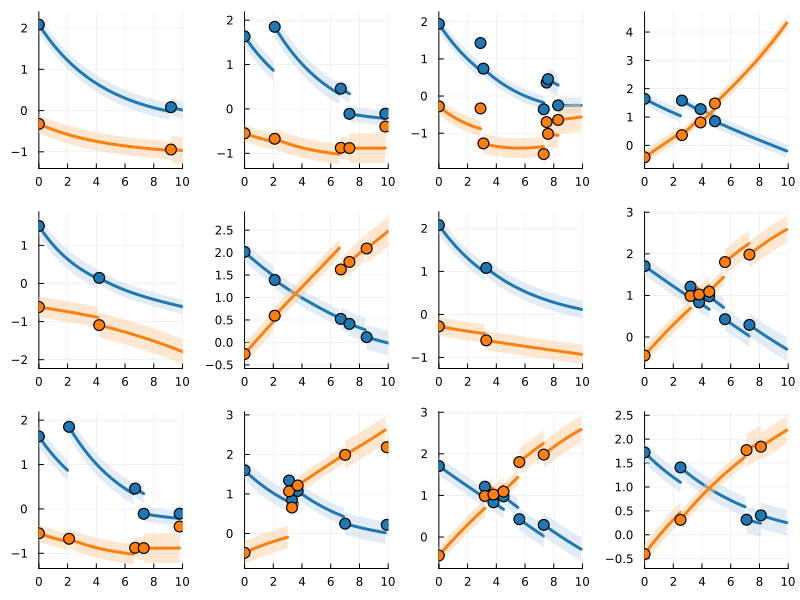

[ Info: 26


mean((loss(data..., m, args = args) for data = trainingdata)) = 12.893355f0


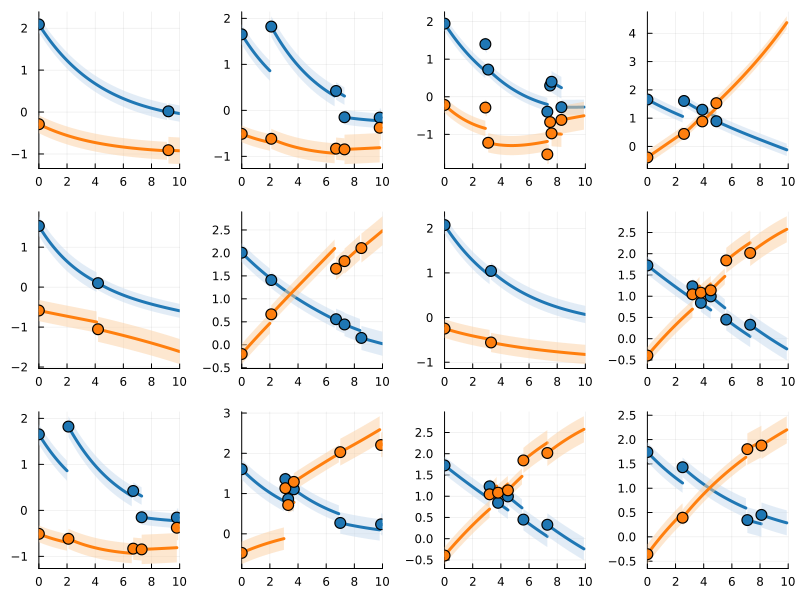

[ Info: 27


mean((loss(data..., m, args = args) for data = trainingdata)) = 12.783038f0


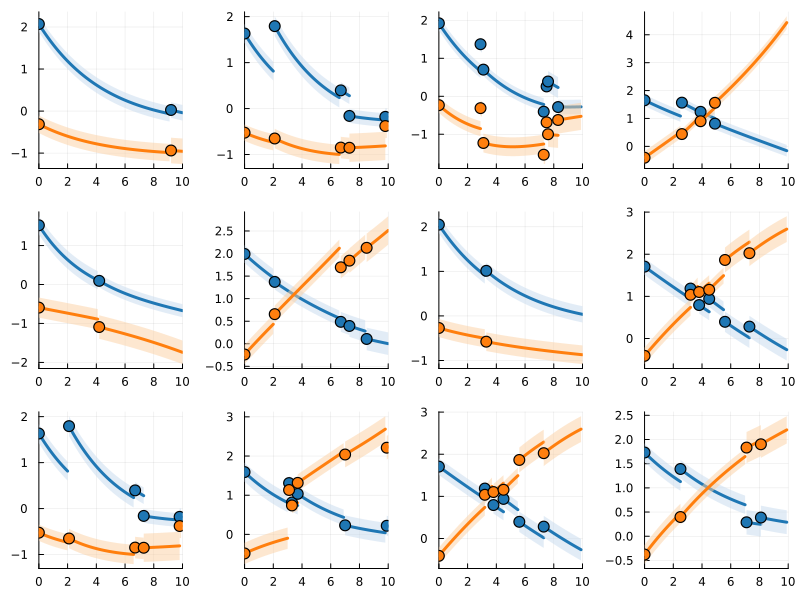

[ Info: 28


mean((loss(data..., m, args = args) for data = trainingdata)) = 12.6216545f0


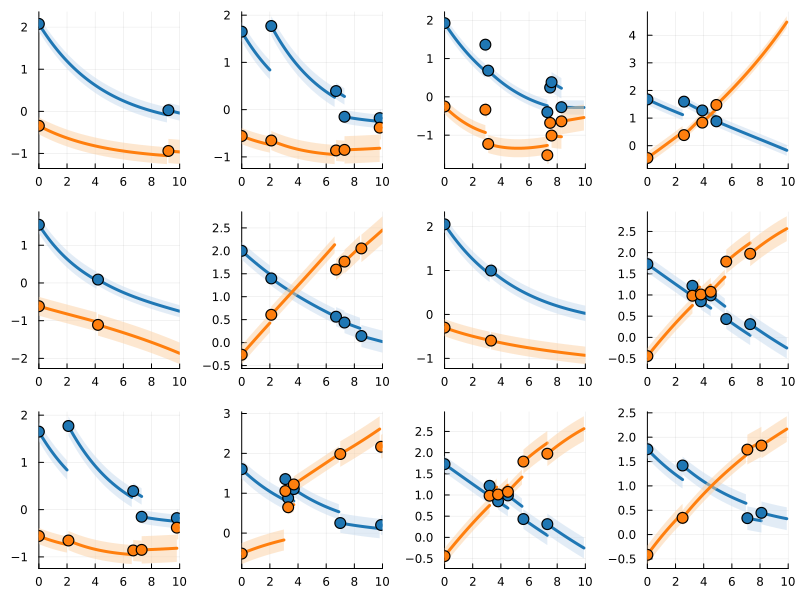

[ Info: 29


mean((loss(data..., m, args = args) for data = trainingdata)) = 12.4545145f0


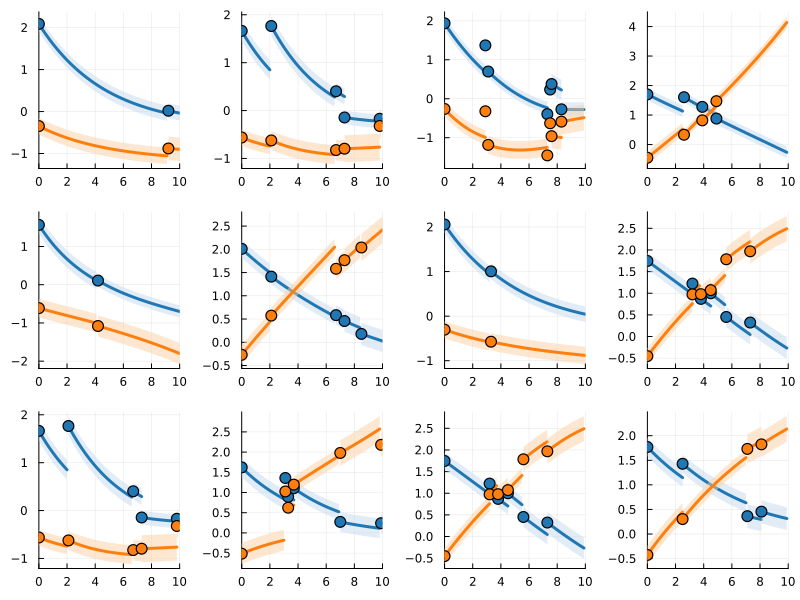

[ Info: 30


mean((loss(data..., m, args = args) for data = trainingdata)) = 12.369594f0


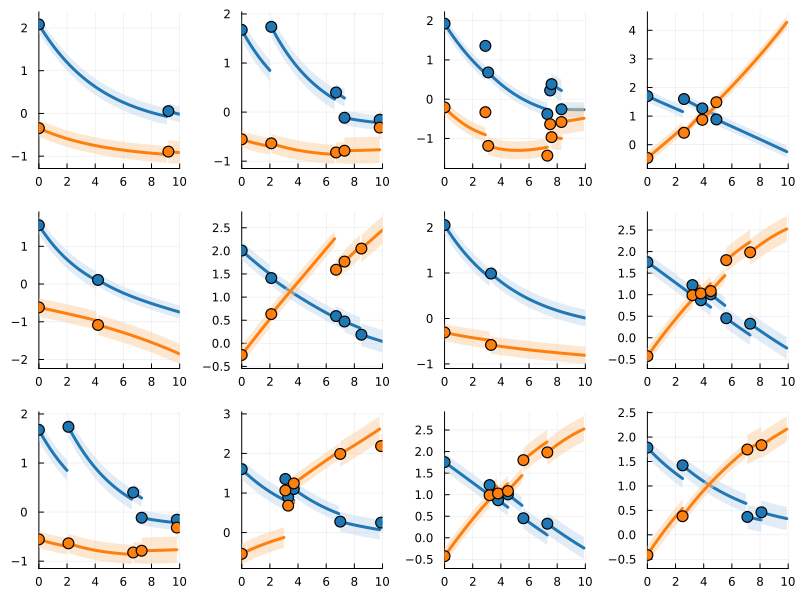

odevae(10, 50, 2, Chain(Dense(50 => 50, tanh), Dense(50 => 4, #51), Scale(4)), Dense(10 => 10, #53), Dense(10 => 2), Chain(Dense(10 => 2, #54), Scale(2)), Dense(2 => 10, tanh), Dense(10 => 10), Dense(10 => 10), LatentDynamics.params_fullhomogeneous)

In [9]:
args = LossArgs(skipt0=true, weighting=true, 
                λ_variancepenalty=0.0f0,
                λ_μpenalty=0.5f0
)

lr = 0.0005
epochs = 30

Random.seed!(42)
selected_ids = rand(collect(1:length(xs)), 12)
function make_plot(m)
    myplot = plot_selected_ids_piecewise(m, data, selected_ids, sol_group1, sol_group2, t_range; 
        showOLS=false, 
        swapcolorcoding=true, 
        sort_inds=false, 
        showtitle = false, 
        showtruesol = false
    )
    plot!(myplot, size=(800,600))
    return myplot
end

train_model!(m, xs, xs_baseline, tvals, 
    lr, epochs, args; 
    verbose=true, 
    plotting=true, 
    plot_func=make_plot
)

## Evaluating the model

We can now evaluate the model by visualizing learnt trajectories of exemplary patients compared to the ground truth. 

Specifically, the following code re-creates Figure 2 from the paper:

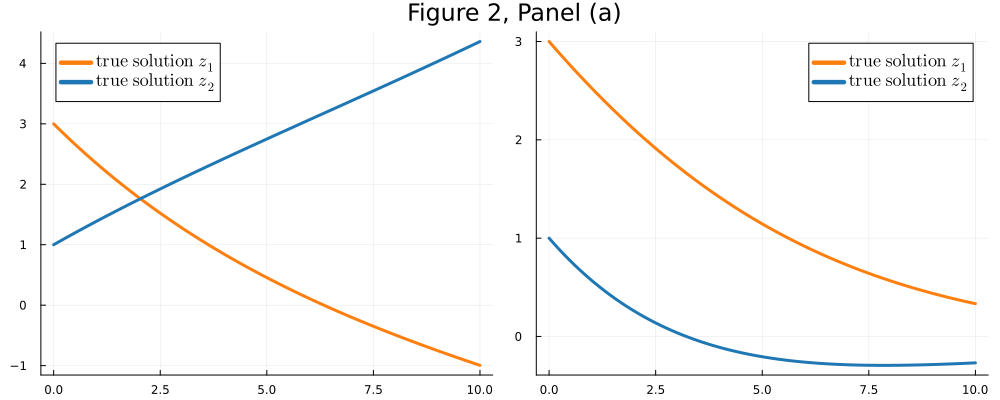

In [10]:
panel_a = plot(
    plot_truesolution(1,  data, t_range, sol_group1, sol_group2, showdata=false), 
    plot_truesolution(2, data, t_range, sol_group1, sol_group2, showdata=false), 
    layout=(1,2), 
    size=(1000, 400), 
    plot_title = "Figure 2, Panel (a)"
)

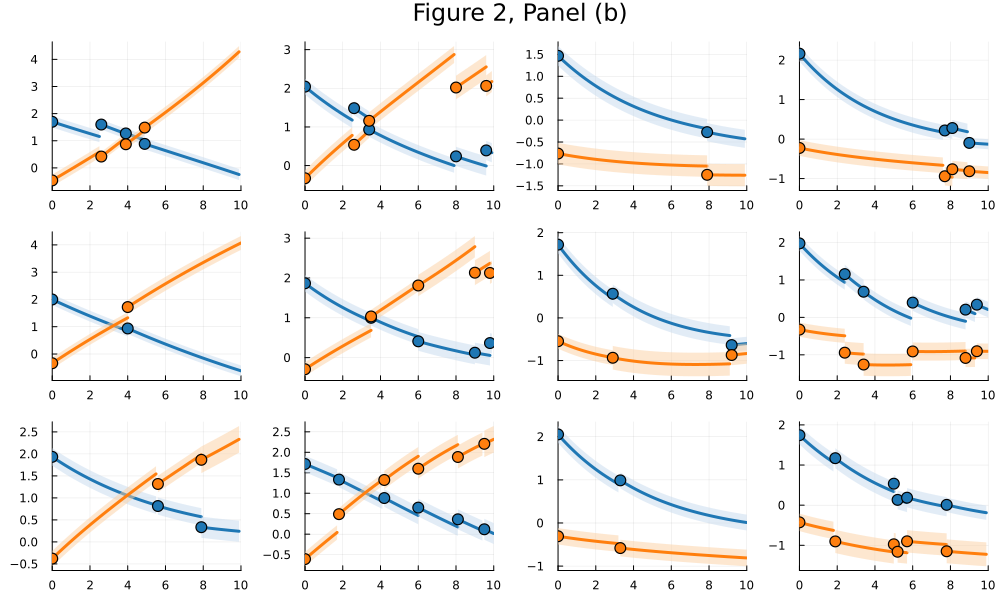

In [11]:
selection = [71, 99, 19, 26, 79, 51, 57, 58, 85, 21, 62, 86,]
panel_b = plot_selected_ids_piecewise(m, data, selection, sol_group1, sol_group2, t_range; 
    showOLS=false, swapcolorcoding=true, sort_inds=false, showtitle=false, showtruesol=false
)
plot!(panel_b, size=(1000, 600), plot_title = "Figure 2, Panel (b)")

We can now create the final figure and save to the `results` folder. 

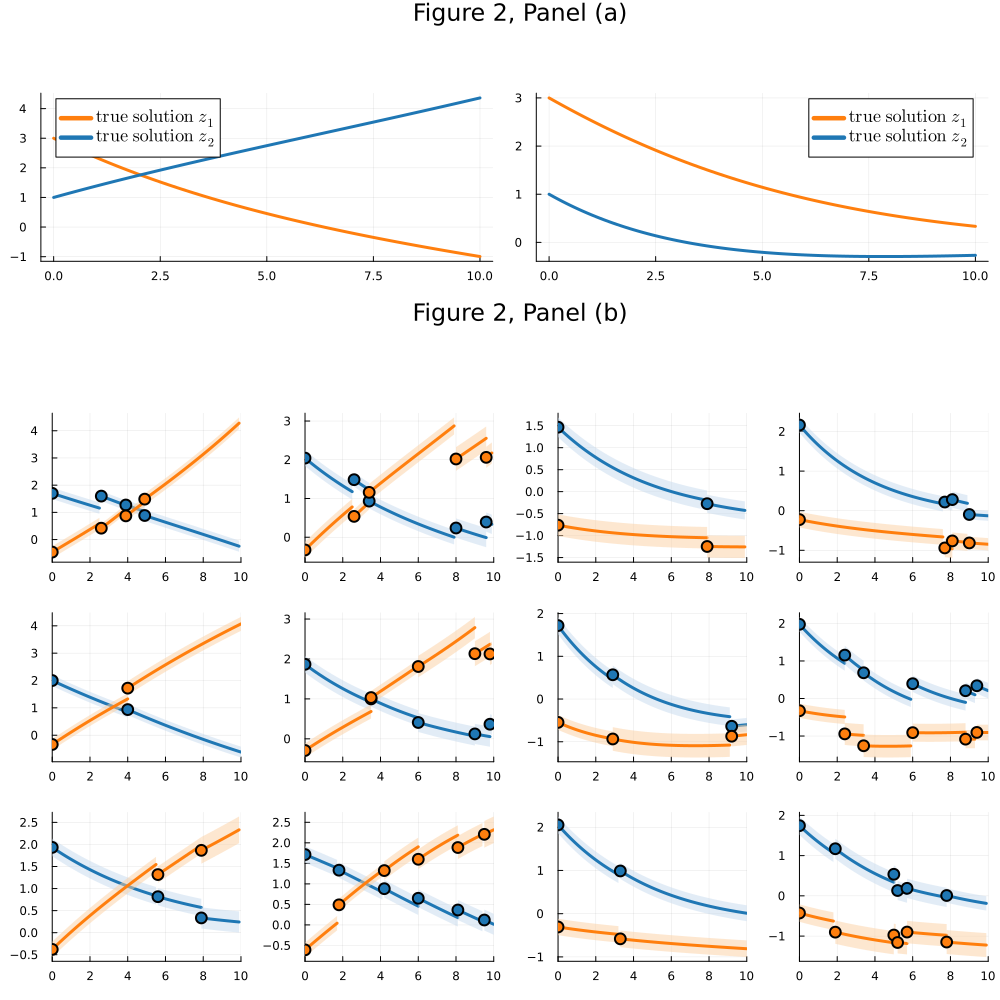

In [12]:
l = @layout [a{0.3h}; b{0.7h}]
figure2 = plot(panel_a, panel_b, layout=l, size = (1000, 1000))
savefig(figure2, joinpath(save_dir, "Figure2_simulation.pdf"))
figure2


## Simpler simulation design 

To empirically verify that our approach reproduces a linear regression fit when the underlying dynamics are simple, we additionally performed a simulation using a simpler two-dimensional system with just two unknown parameters, as described at the end of Section 4.1 and in the supplementary material, Section 6.3 of the manuscript. 

In the simpler simulation scenario with a constant two-dimensional ODE-system, estimating the rate parameter of the ODE and the initial condition is equivalent to fitting a simple linear regression with time as dependent variable separately for each latent dimension. Thus, local ODE fits from our model should closely match a global linear regression fit of the complete time series. 

Again, we simulated two groups of individuals with different trends. The corresponding ODE systems are given by

$$	
\begin{aligned}
		\frac{d}{dt}\begin{pmatrix} u_1 \\ u_2 \end{pmatrix}(t) &= \begin{pmatrix} -0.2 \\ 0.1 \end{pmatrix} ; \\
		\begin{pmatrix} u_1 \\ u_2 \end{pmatrix}(0) &= \begin{pmatrix} 2 \\ 1 \end{pmatrix}
	\end{aligned} \quad \quad \quad \begin{aligned}
		\frac{d}{dt}\begin{pmatrix} u_1 \\ u_2 \end{pmatrix}(t) &= \begin{pmatrix} -0.1 \\ -0.2 \end{pmatrix}; \\
		\begin{pmatrix} u_1 \\ u_2 \end{pmatrix}(0) &= \begin{pmatrix} 2 \\ 1 \end{pmatrix}.
\end{aligned}
$$

We simulate data as before and train the model. 


We set the dynamics to the simpler system with only 2 parameters and define the system and its solutions. 

In [13]:
dynamics = params_driftonly

trueparams_group1 = [-0.2f0,  0.1f0]
trueparams_group2 = [-0.1f0, -0.2f0]

true_x0 = Float32[2, 1]
#true_x0 = Float32[3, 1]

ODEparams1 = dynamics(trueparams_group1)
ODEparams2 = dynamics(trueparams_group2)

tspan = (0.0f0, 10.0f0)

t_range = collect(range(tspan..., step=0.1f0))

sol_group1 = hcat(map(t -> generalsolution(t, true_x0, ODEparams1...)[1], t_range)...)
sol_group2 = hcat(map(t -> generalsolution(t, true_x0, ODEparams2...)[1], t_range)...)

2×101 Matrix{Float32}:
 2.0  1.99  1.98  1.97  1.96  1.95  1.94  …   1.04   1.03   1.02   1.01   1.0
 1.0  0.98  0.96  0.94  0.92  0.9   0.88     -0.92  -0.94  -0.96  -0.98  -1.0

Now, we generate data as before and visualize it together with the ground truth trjaectories. 

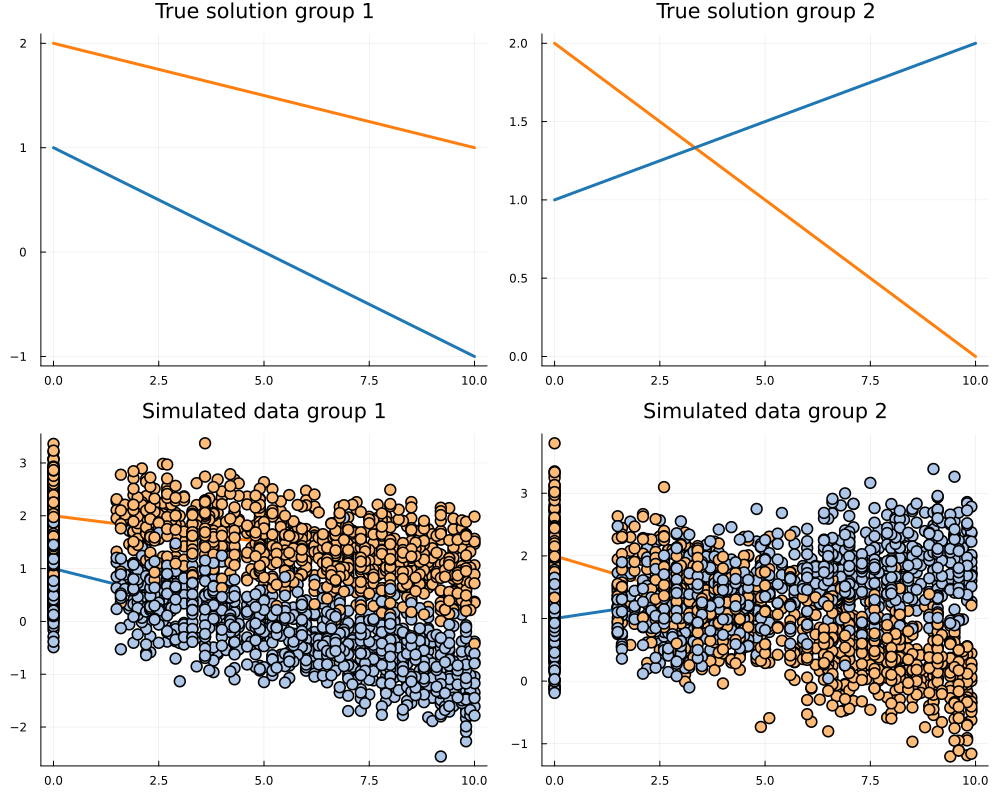

In [14]:
n = 100 
p = 10
q, q_info = 50, 10
dt=0.1f0

# choose simulation setting for baseline variables 
baseline_simulation = "trueparams" # alternative: "groupsonly"

# set seed for reproducibility
Random.seed!(12);

# generate time dependent variables
xs, tvals, group1, group2 = generate_xs(n, p, true_x0, sol_group1, sol_group2, maxntps=8); # default vals: t_start=1.5, t_end=10, dt=0.1, σ_var=0.1, σ_ind=0.5
# generate baseline variables
if baseline_simulation == "trueparams"
    xs_baseline = generate_baseline(n, q, q_info, group1, trueparams_group1, trueparams_group2); # defaul vals: σ_info=0.1, σ_noise=0.1
elseif baseline_simulation == "groupsonly"
    xs_baseline = generate_baseline(n, q, q_info, group1); # default vals: σ_info=1, σ_noise=1
else
    error("Please select either 'trueparams' or 'groupsonly' as mode for simulation of baseline variables")
end

data = simdata(xs, xs_baseline, tvals, group1, group2);

plot(plot_truesolution(2, data, t_range, sol_group1, sol_group2, showdata=false), 
    plot_truesolution(1,  data, t_range, sol_group1, sol_group2, showdata=false), 
    plot_truesolution(2, data, t_range, sol_group1, sol_group2, showdata=true), 
    plot_truesolution(1,  data, t_range, sol_group1, sol_group2, showdata=true),
    layout = (2,2), legend = false,
    size = (1000, 800), 
    title=["True solution group 1" "True solution group 2" "Simulated data group 1" "Simulated data group 2"]
)

We can now define and train a model as before. 

[ Info: 1


mean((loss(data..., m, args = args) for data = trainingdata)) = 15.999491f0


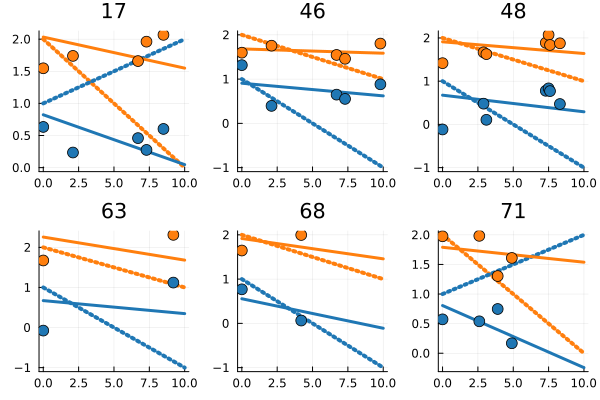

nothing

[ Info: 2


mean((loss(data..., m, args = args) for data = trainingdata)) = 14.741741f0


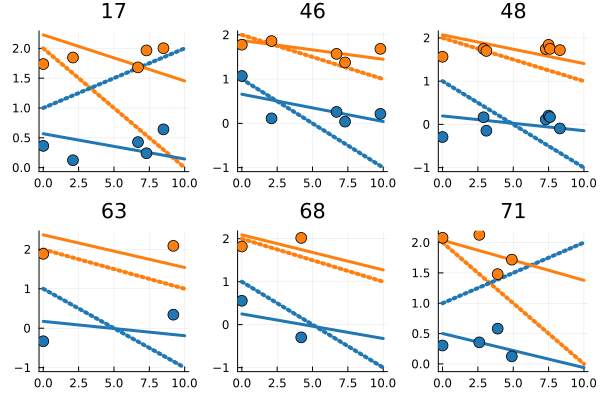

nothing

[ Info: 3


mean((loss(data..., m, args = args) for data = trainingdata)) = 14.034346f0


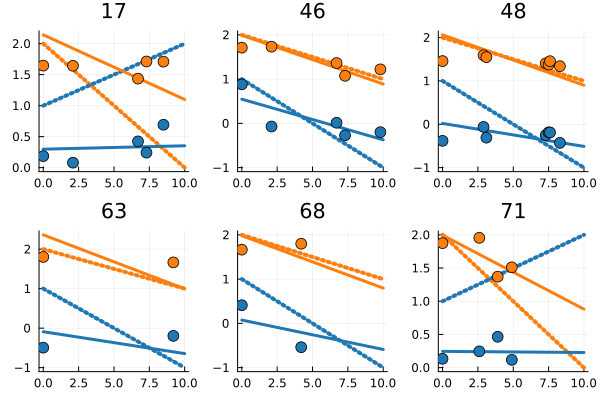

nothing

[ Info: 4


mean((loss(data..., m, args = args) for data = trainingdata)) = 13.512747f0


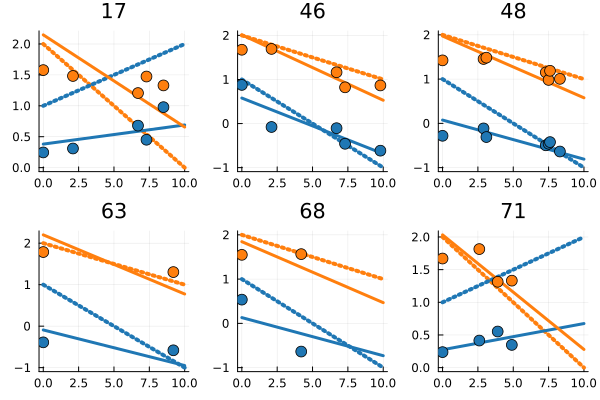

nothing

[ Info: 5


mean((loss(data..., m, args = args) for data = trainingdata)) = 12.907832f0


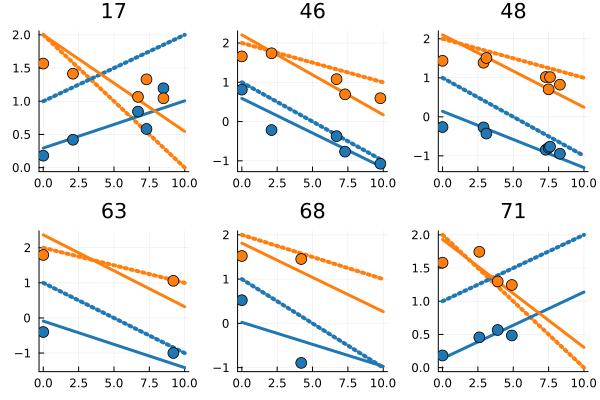

nothing

[ Info: 6


mean((loss(data..., m, args = args) for data = trainingdata)) = 12.25252f0


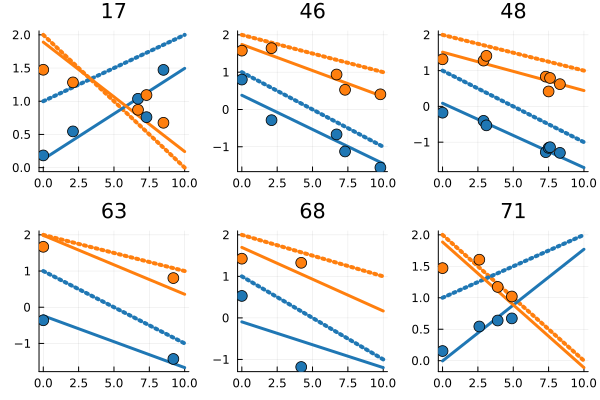

nothing

[ Info: 7


mean((loss(data..., m, args = args) for data = trainingdata)) = 11.610471f0


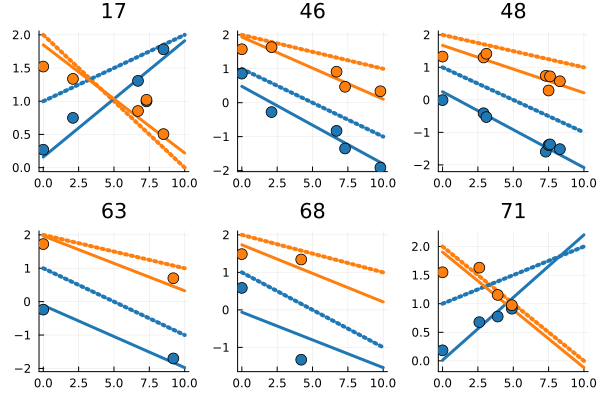

nothing

[ Info: 8


mean((loss(data..., m, args = args) for data = trainingdata)) = 11.213157f0


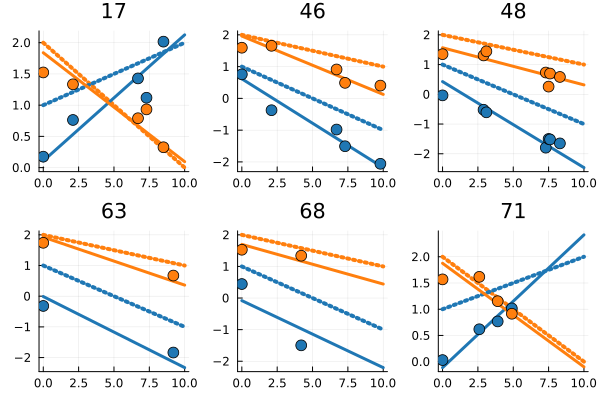

nothing

[ Info: 9


mean((loss(data..., m, args = args) for data = trainingdata)) = 10.684461f0


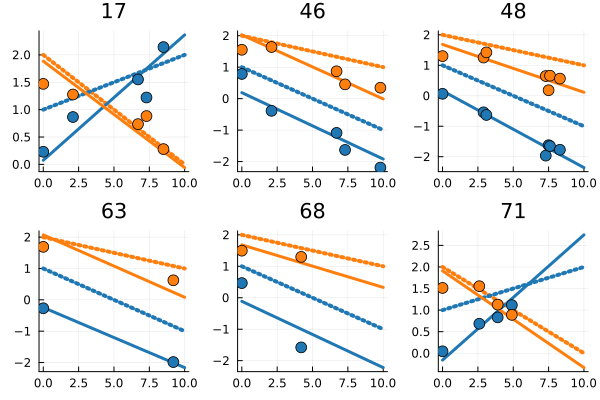

nothing

[ Info: 10


mean((loss(data..., m, args = args) for data = trainingdata)) = 10.738962f0


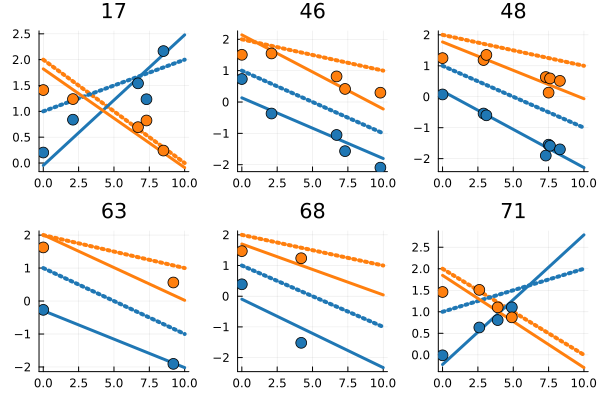

nothing

[ Info: 11


mean((loss(data..., m, args = args) for data = trainingdata)) = 10.4297f0


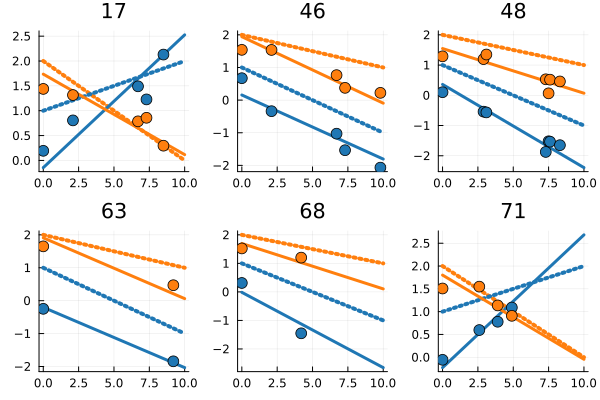

nothing

[ Info: 12


mean((loss(data..., m, args = args) for data = trainingdata)) = 10.35505f0


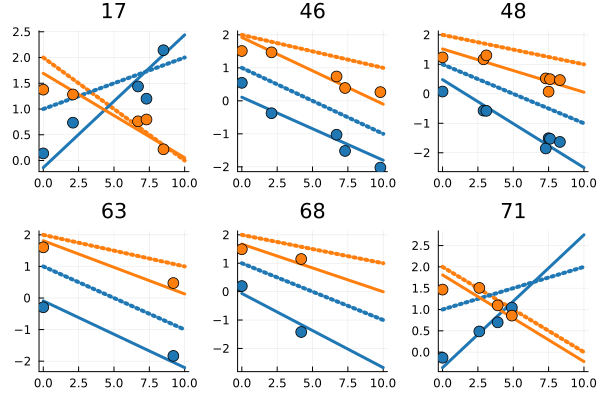

nothing

[ Info: 13


mean((loss(data..., m, args = args) for data = trainingdata)) = 10.273391f0


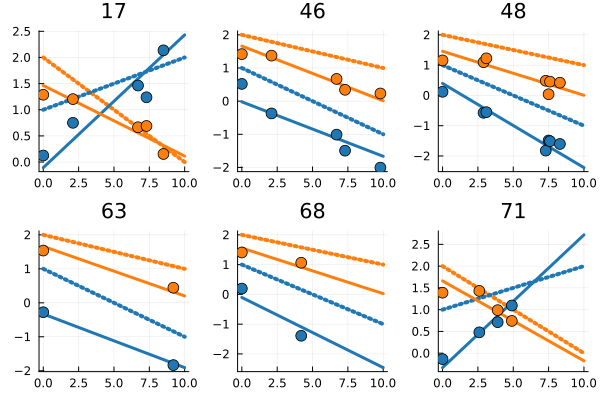

nothing

[ Info: 14


mean((loss(data..., m, args = args) for data = trainingdata)) = 10.183243f0


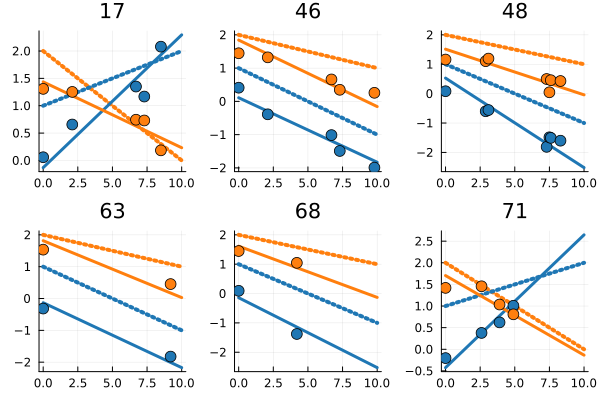

nothing

[ Info: 15


mean((loss(data..., m, args = args) for data = trainingdata)) = 10.130306f0


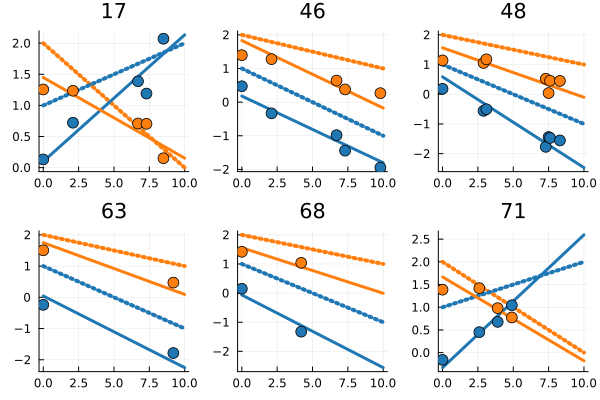

nothing

[ Info: 16


mean((loss(data..., m, args = args) for data = trainingdata)) = 10.135465f0


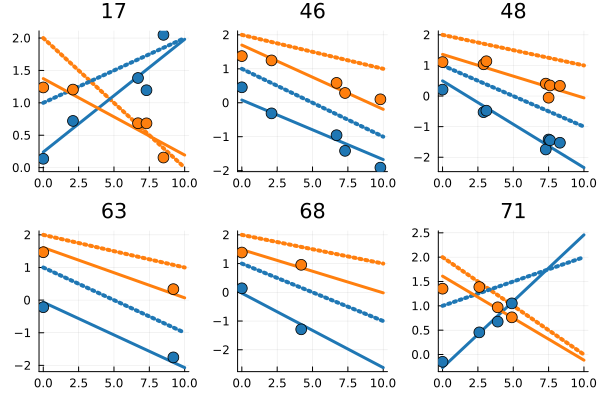

nothing

[ Info: 17


mean((loss(data..., m, args = args) for data = trainingdata)) = 10.031537f0


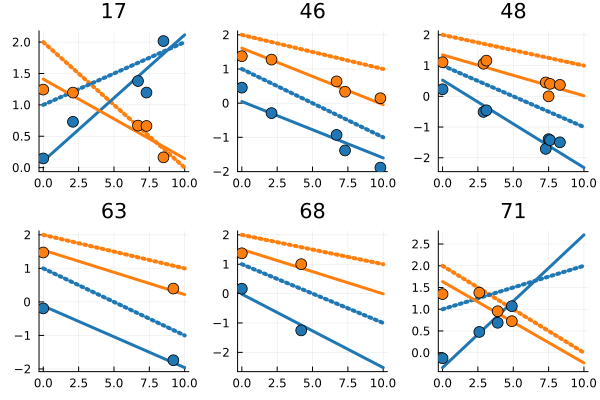

nothing

[ Info: 18


mean((loss(data..., m, args = args) for data = trainingdata)) = 9.876967f0


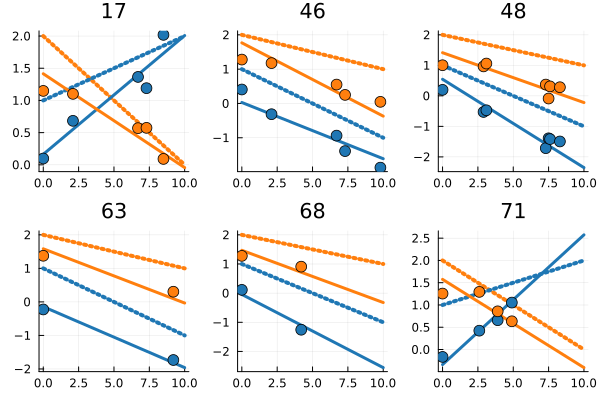

nothing

[ Info: 19


mean((loss(data..., m, args = args) for data = trainingdata)) = 9.964865f0


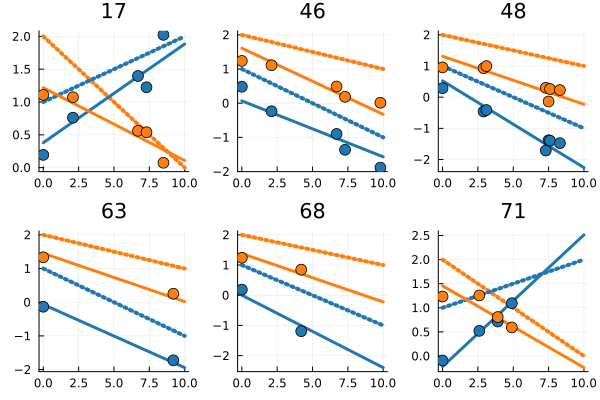

nothing

[ Info: 20


mean((loss(data..., m, args = args) for data = trainingdata)) = 9.967064f0


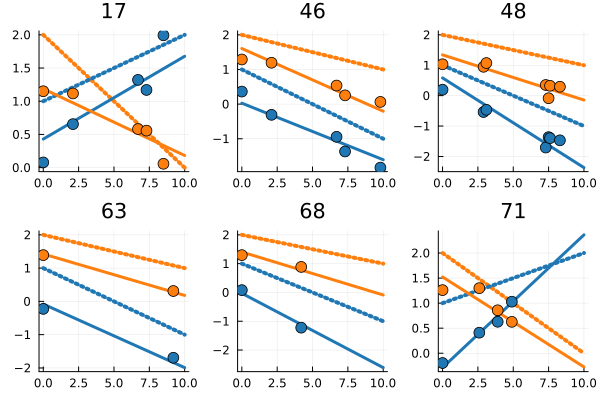

nothing

[ Info: 21


mean((loss(data..., m, args = args) for data = trainingdata)) = 9.861456f0


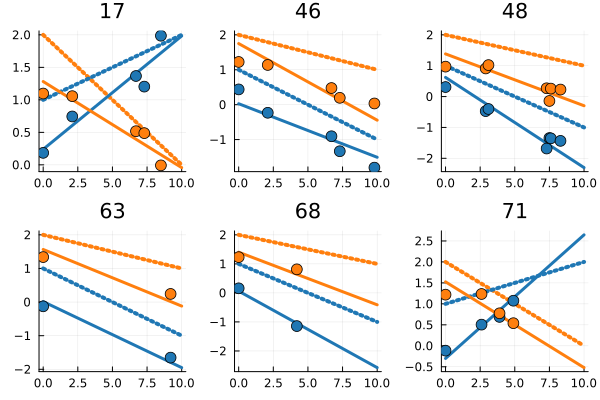

nothing

[ Info: 22


mean((loss(data..., m, args = args) for data = trainingdata)) = 9.996737f0


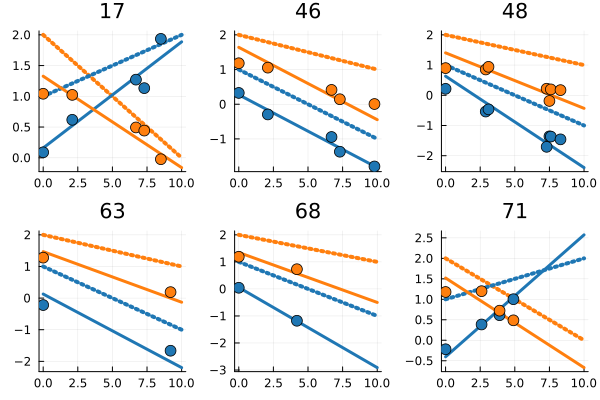

nothing

[ Info: 23


mean((loss(data..., m, args = args) for data = trainingdata)) = 9.85324f0


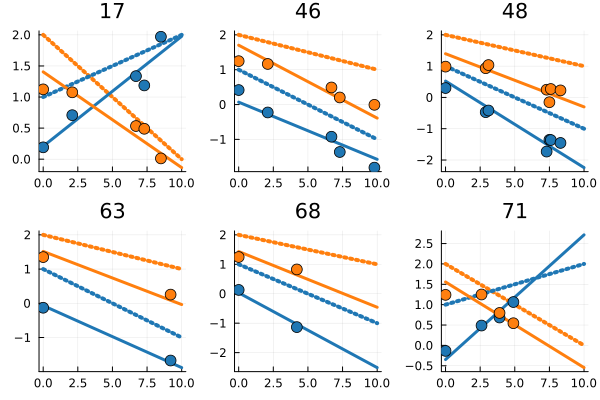

nothing

[ Info: 24


mean((loss(data..., m, args = args) for data = trainingdata)) = 9.897654f0


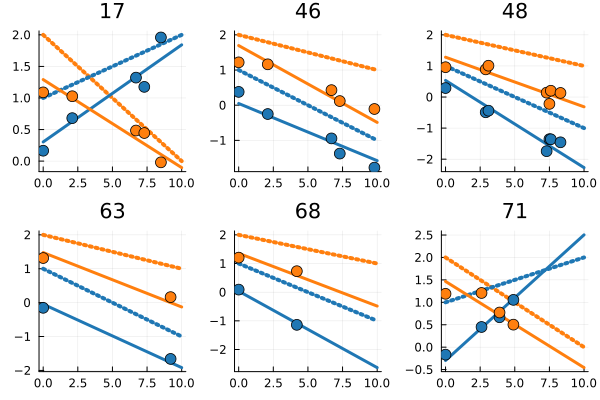

nothing

[ Info: 25


mean((loss(data..., m, args = args) for data = trainingdata)) = 9.809452f0


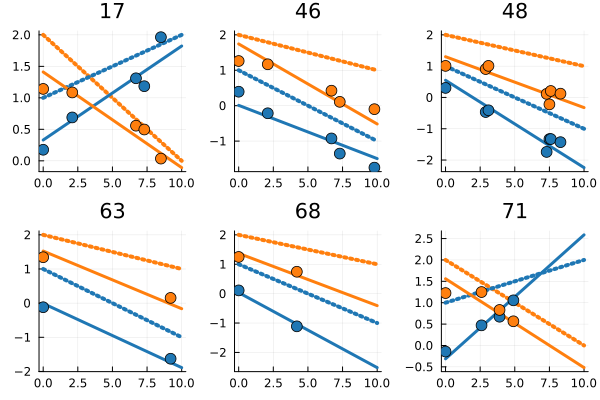

nothing

odevae(10, 50, 2, Chain(Dense(50 => 50, tanh), Dense(50 => 2, #51), Scale(2)), Dense(10 => 10, #53), Dense(10 => 2), Chain(Dense(10 => 2, #54), Scale(2)), Dense(2 => 10, tanh), Dense(10 => 10), Dense(10 => 10), LatentDynamics.params_driftonly)

In [15]:
# define model behaviour 
args = LossArgs(
    skipt0=true, 
    weighting=true, 
    λ_variancepenalty=0.0f0,
    λ_μpenalty=0.5f0
)
# Defaults: all penalties = 0, weighting=false, firstonly=false

# define numbers of individuals and variables 
n = length(xs)
Random.seed!(42)
selected_inds = rand(collect(1:length(xs)), 6)

# init model 
modelargs = ModelArgs(p=size(xs[1],1), 
                    q=length(xs_baseline[1]), # zdim=2 default
                    dynamics=dynamics,
                    seed=13, # 1234
                    bottleneck=false,
                    scale_sigmoid=1, # Struktur des ODE-net: zulässiger Bereich der ODE-Parameter
                    add_diagonal=true # Struktur des ODE-net: Diagonal-Layer am Ende Ja/Nein
)
m = odevae(modelargs)

# define optimization hyperparameters
lr = 0.001 # 0.0005
epochs = 25

make_plot(m) = eval_z_trajectories(m, data, selected_inds, sol_group1, sol_group2, t_range, args; showOLS=false)

train_model!(m, xs, xs_baseline, tvals, 
    lr, epochs, args; 
    verbose=true, 
    plotting=true, 
    plot_func=make_plot
)

Let's evaluate the results, again by first plotting the learnt trajectories of a few randomly selected individuals from each group. 

In addition to showing the fitted trajectories of our ODE approach, we also create figures with global and piecewise linear regression fits as described in the supplementary material, Section 6.3, and reproduce Figures 4, 5 and 6 there. 

The trajectories indeed closely match those of a global regression model. Yet, to fit this global regression model, the complete time series has to be observed, while ODE solutions are obtained using baseline information and the value at the last observed time point only. 

If only this limited information is available and extrapolations have to be calculated based on previously observed values only, the regression approach performs worse, as reflected by a substantial drop in prediction performance compared to the ODE approach, both in latent space and on the level of the reconstructed items. We calculate these prediction errors and save them to a dataframe, to reproduce Table 1 in the supplementary material, Section 6.3. 

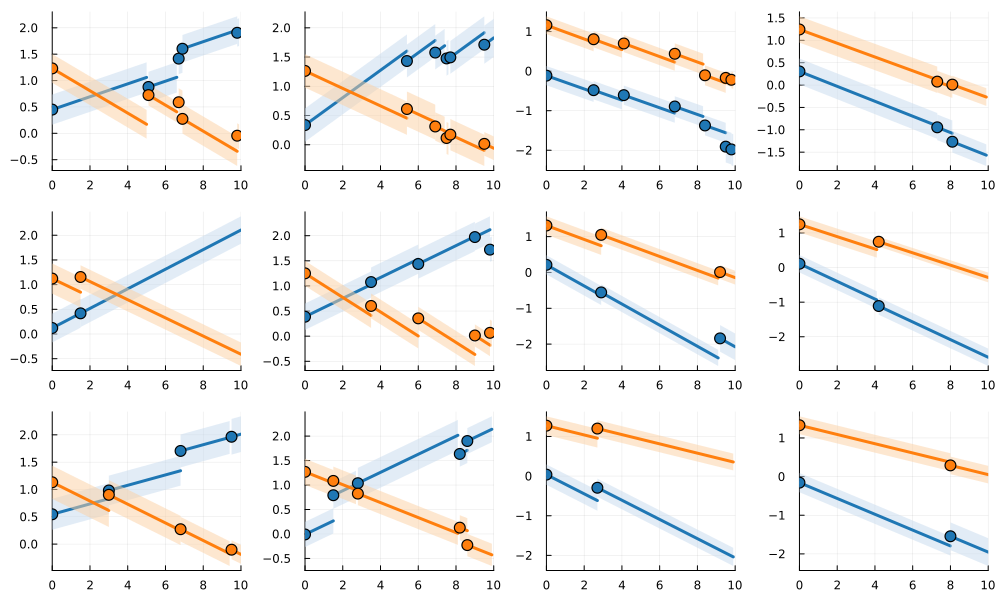

In [16]:
selection = [11, 2, 24, 33, 16, 51, 57, 68, 53, 59, 95, 89]
# without OLS
panelplot = plot_selected_ids_piecewise(m, data, selection, sol_group1, sol_group2, t_range; 
    showOLS=false, swapcolorcoding=false, sort_inds=false, showtitle=false, showtruesol=false
)
savefig(panelplot, joinpath(save_dir,"Figure4_simulation_ODE.pdf"))
plot!(panelplot, size=(1000, 600))

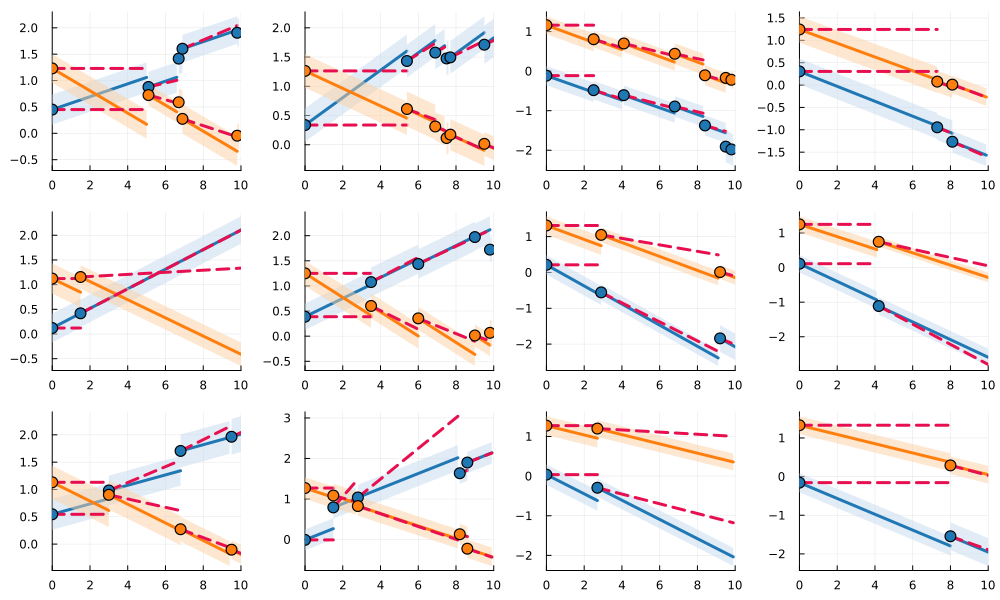

In [17]:
# with piecewise OLS
panelplot = plot_selected_ids_piecewise(m, data, selection, sol_group1, sol_group2, t_range; 
    showtruesol=false,
    showOLS=true, 
    showglobalOLS=false,
    swapcolorcoding=false, 
    sort_inds=false, 
    showtitle=false    
)
savefig(panelplot, joinpath(save_dir,"Figure5_simulation_piecewise_regression.pdf"))
plot!(panelplot, size=(1000, 600))

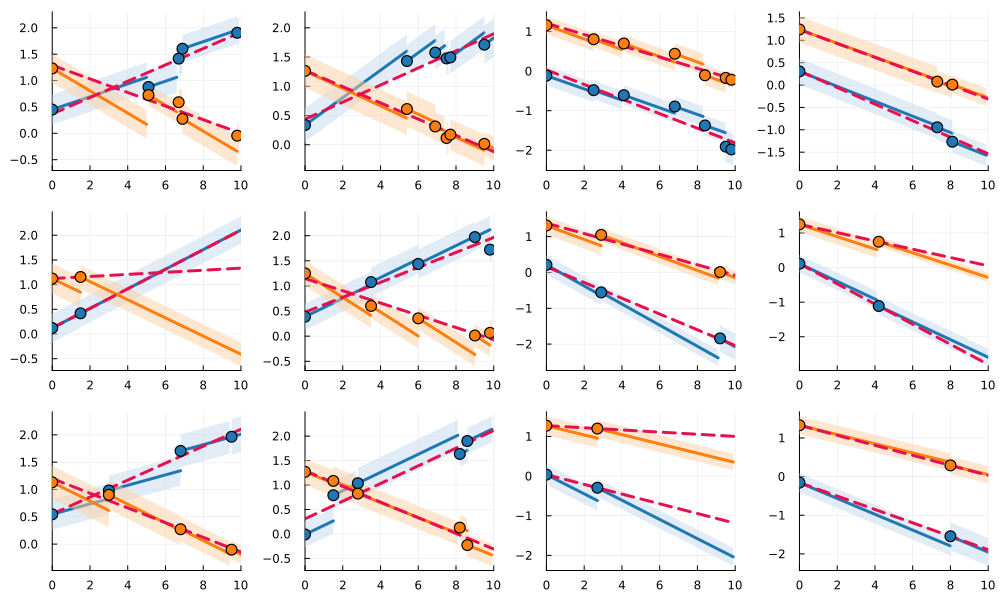

In [18]:
# with global OLS
panelplot = plot_selected_ids_piecewise(m, data, selection, sol_group1, sol_group2, t_range; 
    showtruesol=false,
    showOLS=false, 
    showglobalOLS=true, 
    swapcolorcoding=false, 
    sort_inds=false, 
    showtitle=false
)
savefig(panelplot, joinpath(save_dir,"FIgure6_simulation_global_regression.pdf"))
plot!(panelplot, size=(1000, 600))

Now, we calculate the prediction errors for the piecewise regression approach and compare to simpler baseline models. We store the results in a dataframe and save a CSV file in the `results` folder. 

In [19]:
# measure prediction performance at each time point after the first, for both regression and our approach. 
ODEprederrs, OLSprederrs, locfprederrs, interceptprederrs = eval_prediction(m, data)
sum(ODEprederrs)
sum(OLSprederrs)
sum(locfprederrs)
sum(interceptprederrs)

latent_pred_ODE = mean(sum(ODEprederrs)) / length(data.xs)
latent_pred_OLS = mean(sum(OLSprederrs)) / length(data.xs)
latent_pred_LOCF = mean(sum(locfprederrs)) / length(data.xs)
latent_pred_IC = mean(sum(interceptprederrs)) / length(data.xs)

sum(ODEprederrs) .- sum(locfprederrs)

ODEprederrs, OLSprederrs, locfprederrs, interceptprederrs = eval_reconstructed_prediction(m, data)
rec_pred_ODE = mean(sum(ODEprederrs)) / length(data.xs)
rec_pred_OLS = mean(sum(OLSprederrs)) / length(data.xs)
rec_pred_LOCF = mean(sum(locfprederrs)) / length(data.xs)
rec_pred_IC = mean(sum(interceptprederrs)) / length(data.xs)

mean(sum(ODEprederrs)) .- mean(sum(locfprederrs))

prediction_errors = DataFrame(
    model = ["ODE", "OLS", "LOCF"], 
    latent_prediction = [round(latent_pred_ODE, digits=3), round(latent_pred_OLS, digits=3), round(latent_pred_LOCF, digits=3)], 
    reconstructed_prediction = [round(rec_pred_ODE, digits=3), round(rec_pred_OLS, digits=3), round(rec_pred_LOCF, digits=3)]
)
CSV.write(joinpath(save_dir, "simulation_prediction_errors.csv"), string.(prediction_errors))
prediction_errors

┌ Warning: Layer with Float32 parameters got Float64 input.
│   The input will be converted, but any earlier layers may be very slow.
│   layer = Dense(2 => 10, tanh)  # 30 parameters
│   summary(x) = "2×2 Matrix{Float64}"
└ @ Flux ~/.julia/packages/Flux/n3cOc/src/layers/stateless.jl:60


Row,model,latent_prediction,reconstructed_prediction
,String,Float64,Float32
1,ODE,0.415,1.136
2,OLS,0.985,3.697
3,LOCF,1.1,1.793
